<a href="https://colab.research.google.com/github/MiguelOlivFig/Sportify_Clusters/blob/main/Cluster_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sportify Customer Segmentation Project

## Introduction

This Jupyter notebook contains the code and description for a Data Science Project. The goal is to apply clustering techniques to segment Sportify's customer base using three datasets that provide insights into customer behaviors and characteristics.

## Objective

- **Analyze customer data**: Explore and process data from three key datasets.
- **Segment the customer base**: Utilize clustering algorithms to identify distinct groups within the customer data.

## Datasets

We will work with the following datasets:

#### **Products.xlsx** :

- **Customer_ID** - Customer´s unique identification
- **Fitness&Gym** - Money spent on Fitness&Gym products
- **Outdoor Activites** - Money spent on Outdoor activities products
- **TeamGames** - Money spent on Team Games products
- **Hiking&Running** - Money spent on Hiking and Running products
- **Last_Purchase** - Date from the last purchase
- **TotalProducts** - Number of products bought by the customer

#### **Digital_Contact.csv**:

- **Customer_ID** - Customer´s unique identification
- **Email_Clicks** - The number of times a customer has clicked on email advertisements or links sent
- **App_Clicks** - The frequency with which a customer interacts with the company´s mobile application, such as clicking on product listings, accessing features, or making purchases
- **SM_Comments** - The number of comments made by a customer on the company´s social media posts
- **SM_Likes** - The number of times a customer has liked posts or content shared
- **SM_Shares** - The frequency with which a customer shares content or posts from the company
- **SM_Clicks** - The number of times a customer has clicked on links or advertisements shared by the company on social media platforms

#### **Demographic.txt**:

- **Customer_ID** - Customer´s unique identification
- **name** - Customer´s name
- **birth_year** - Customer´s Year of Birth
- **City** - Customer´s City
- **dependents** - if the Customer has dependents (1- Yes; 0- No)
- **education_level** - Customer´s Education Level

## Approach

The project will include:
1. **Data Loading and Exploration**: Load the data and understand its structure.
2. **Preprocessing**: Clean and prepare the data for analysis.
3. **Clustering**: Implement clustering to discover customer segments.
4. **Analysis and Recommendations**: Analyze the clusters and suggest strategies based on the findings.

<a name='import'>
<font color = '#BED62F'>
    
# **1. Import Data** </font>
</a>

<a name='lib'></a>

## **1.1. Import the needed libraries and documents**


Set up the environment. Import all libraries needed to run the notebook.

In [ ]:
# Imports
import io
import warnings
from datetime import date

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
#from google.colab import files
from scipy.cluster import hierarchy
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import MinMaxScaler

warnings.filterwarnings('ignore')

In [ ]:
# Set display options to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

## **1.2. Data Loading**

In this section, we will load the datasets provided for the project. Each dataset contains different aspects of customer information, which are essential for our analysis. The datasets are in various formats, including CSV, Excel, and text files.

### Datasets Overview

We will be handling three primary datasets:

- **Digital_Contact.csv**: Contains information about how customers interact with digital platforms, such as email, social media, and mobile apps.
- **Products.xlsx**: Details the spending habits of customers on different sports-related products.
- **Demographic.txt**: Provides demographic information about customers, including age, city, and education level.

### Loading the Data

- Load the data
- Merge the datasets

In [ ]:
from google.colab import files
uploaded_files = files.upload()

# Check names of the files loaded but not print their content
print("Uploaded files:")
for filename in uploaded_files.keys():
    print(filename)

Saving Demographic.txt to Demographic.txt
Saving Digital_Contact.csv to Digital_Contact.csv
Saving Products.xlsx to Products.xlsx
Uploaded files:
Demographic.txt
Digital_Contact.csv
Products.xlsx


In [ ]:
#Import tables

#This dataset is showing digital engagement metrics, which can help us understand how customers interact with and what channels they are most responsive to
demo = pd.read_csv(r'/content/Demographic.txt', delimiter='\t')
#This DataFrame provides a transactional overview of customer purchases across different product categories
products = pd.read_excel(r'/content/Products.xlsx')
digital = pd.read_csv(r'/content/Digital_Contact.csv', delimiter=';')


After analysing all datasets provided we identify that each dataset has a Cust_ID column, indicating that they can be merged to form a complete picture of each customer's demographics, purchasing behavior, and digital engagement

In [ ]:
df = demo.merge(digital, on = 'Cust_ID' ).merge(products, on = 'Cust_ID') # Merge three datasets
df_original = df.copy() # Keep a copy of the original dataset
df.head()

,Cust_ID,name,birth_year,education_level,dependents,City,Email_Clicks,SM_Comments,App_Clicks,SM_Likes,SM_Shares,SM_Clicks,Fitness&Gym,Hiking&Running,Last_Purchase,TeamGames,OutdoorActivities,TotalProducts
0,4,Mr Daniel Spencer,2002,Master,1,NaN,72,1,7,7,1.0,73,0,76,2024-02-19,248,37,6
1,5,Miss Abigail Garcia,1994,high school,0,Birmingham,15,20,1,35,15.0,16,0,75,2024-02-17,248,37,6
2,6,Miss Laura Williams,2005,PhD,1,NaN,9,7,3,73,19.0,10,6,69,2024-02-15,215,34,5
3,9,Mr Justin Hamilton,2003,high school,0,NaN,67,0,2,0,1.0,101,36,71,2024-02-13,248,35,8
4,10,Mr Steven Vaughn,2002,less than high school,0,NaN,38,0,1,9,0.0,56,8,97,2024-02-15,204,34,5


In [ ]:
# Set Cust_ID as the dataset index
df.set_index('Cust_ID', inplace = True)
df.head()

,name,birth_year,education_level,dependents,City,Email_Clicks,SM_Comments,App_Clicks,SM_Likes,SM_Shares,SM_Clicks,Fitness&Gym,Hiking&Running,Last_Purchase,TeamGames,OutdoorActivities,TotalProducts
Cust_ID,,,,,,,,,,,,,,,,,
4,Mr Daniel Spencer,2002,Master,1,NaN,72,1,7,7,1.0,73,0,76,2024-02-19,248,37,6
5,Miss Abigail Garcia,1994,high school,0,Birmingham,15,20,1,35,15.0,16,0,75,2024-02-17,248,37,6
6,Miss Laura Williams,2005,PhD,1,NaN,9,7,3,73,19.0,10,6,69,2024-02-15,215,34,5
9,Mr Justin Hamilton,2003,high school,0,NaN,67,0,2,0,1.0,101,36,71,2024-02-13,248,35,8
10,Mr Steven Vaughn,2002,less than high school,0,NaN,38,0,1,9,0.0,56,8,97,2024-02-15,204,34,5


<a name='explore'></a>
<a name='basic'></a>

<font color = '#BED62F'>
    
# **2. Explore Data** </font>




## **2.1. Basic Exploration**

#### Overview
Perform basic exploration:
- Duplicates
- Shape
- Columns
- Info


#### Analysis

In [ ]:
# Check for duplicates
df[df.duplicated()]

,name,birth_year,education_level,dependents,City,Email_Clicks,SM_Comments,App_Clicks,SM_Likes,SM_Shares,SM_Clicks,Fitness&Gym,Hiking&Running,Last_Purchase,TeamGames,OutdoorActivities,TotalProducts
Cust_ID,,,,,,,,,,,,,,,,,


In [ ]:
# Check dataframe shape
df.shape

(4000, 17)

- The dataset doesn't have any duplicates rows.
- It contains a total of 4.000 rows and 17 columns

In [ ]:
# Check dataframe columns
df.columns

Index(['name', 'birth_year', 'education_level', 'dependents', 'City',
       'Email_Clicks', 'SM_Comments', 'App_Clicks', 'SM_Likes', 'SM_Shares',
       'SM_Clicks', 'Fitness&Gym', 'Hiking&Running', 'Last_Purchase',
       'TeamGames', 'OutdoorActivities', 'TotalProducts'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4000 entries, 4 to 6496
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   name               4000 non-null   object        
 1   birth_year         4000 non-null   int64         
 2   education_level    4000 non-null   object        
 3   dependents         4000 non-null   int64         
 4   City               2019 non-null   object        
 5   Email_Clicks       4000 non-null   int64         
 6   SM_Comments        4000 non-null   int64         
 7   App_Clicks         4000 non-null   int64         
 8   SM_Likes           4000 non-null   int64         
 9   SM_Shares          3961 non-null   float64       
 10  SM_Clicks          4000 non-null   int64         
 11  Fitness&Gym        4000 non-null   int64         
 12  Hiking&Running     4000 non-null   int64         
 13  Last_Purchase      4000 non-null   datetime64[ns]
 14  TeamGames    

- We can see that we have 1 datetime variable, 1 flot variable, 12 integer variables and 3 object variables
- All columns are nearly complete with no missing values except for City and SM_Shares, indicating some null inputs that we will have to process further in our analysis

### Advanced Data Exploration

#### Overview
- Identify features types
- Statistical analysis per feature type
- Check clients'data
- Check for data inconsistency
- Kurtosis and skewness analysis

#### Analysis
- The advanced data exploration provides insights into various aspects of the dataset, including categorical, numerical, and date features. It identifies incomplete or misspelled city data, duplicated names, and inconsistent labels for education levels. Additionally, high kurtosis in certain numerical features suggests potential outliers. The action items include rectifying data inconsistencies, resolving duplicated entries, addressing outliers, and further analyzing purchase patterns for targeted marketing insights.


<a name='stats'></a>

## **2.2. Statistical Exploration**



In [ ]:
# Initialize lists to store categorical, numerical, and date column names
categorical_columns = []
numerical_columns = []
date_columns = []

# Iterate over columns
for column in df.columns:
    # Check if the column data type is object (categorical)
    if df[column].dtype == 'object':
        categorical_columns.append(column)
    # Check if the column data type is numeric (int or float)
    elif df[column].dtype in ['int64', 'float64']:
        numerical_columns.append(column)
    # Check if the column data type is datetime
    elif df[column].dtype == 'datetime64[ns]':
        date_columns.append(column)

# Print identified categorical, numerical, and date columns
print("Categorical columns:", categorical_columns)
print("Numerical columns:", numerical_columns)
print("Date columns:", date_columns)

Categorical columns: ['name', 'education_level', 'City']
Numerical columns: ['birth_year', 'dependents', 'Email_Clicks', 'SM_Comments', 'App_Clicks', 'SM_Likes', 'SM_Shares', 'SM_Clicks', 'Fitness&Gym', 'Hiking&Running', 'TeamGames', 'OutdoorActivities', 'TotalProducts']
Date columns: ['Last_Purchase']


**Identify Features' Types:**

Identify the types of features based on the data type.

- `Categorical columns`: ['name', 'education_level', 'City']
- `Numerical columns`: ['birth_year', 'dependents', 'Email_Clicks', 'SM_Comments', 'App_Clicks', 'SM_Likes', 'SM_Shares', 'SM_Clicks', 'Fitness&Gym', 'Hiking&Running', 'TeamGames', 'OutdoorActivities', 'TotalProducts']
- `Date columns`: ['Last_Purchase']

<a name='stats_num'></a>

### **2.2.1. Numerical Variables**

In this point we'll look at the datetime (1), flot (1) and integer (11) variables, in a total of 14 variables.

In [ ]:
df.describe(include="all")

,name,birth_year,education_level,dependents,City,Email_Clicks,SM_Comments,App_Clicks,SM_Likes,SM_Shares,SM_Clicks,Fitness&Gym,Hiking&Running,Last_Purchase,TeamGames,OutdoorActivities,TotalProducts
count,4000,4000.000000,4000,4000.000000,2019,4000.00000,4000.000000,4000.000000,4000.000000,3961.000000,4000.000000,4000.000000,4000.000000,4000,4000.000000,4000.000000,4000.000000
unique,3892,NaN,7,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Mr Michael Jackson,NaN,high school,NaN,Birmingham,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,4,NaN,1280,NaN,1284,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,1989.299000,NaN,0.298000,NaN,25.76225,8.247750,19.526500,26.957000,8.355971,30.349250,32.020250,55.844750,2024-01-30 18:50:02.399999744,176.085000,33.602750,5.329500
min,NaN,1944.000000,NaN,0.000000,NaN,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,2023-10-15 00:00:00,0.000000,28.000000,2.000000
25%,NaN,1980.000000,NaN,0.000000,NaN,8.00000,1.000000,2.000000,4.000000,1.000000,7.000000,25.000000,38.000000,2024-01-20 00:00:00,121.000000,32.000000,4.000000
50%,NaN,1997.000000,NaN,0.000000,NaN,16.00000,4.000000,4.000000,11.000000,2.000000,15.000000,31.000000,47.000000,2024-02-01 00:00:00,180.000000,33.000000,5.000000
75%,NaN,2002.000000,NaN,1.000000,NaN,36.00000,15.000000,7.000000,50.000000,16.000000,60.000000,40.000000,66.000000,2024-02-13 00:00:00,230.000000,35.000000,6.000000
max,NaN,2006.000000,NaN,2.000000,NaN,86.00000,24.000000,127.000000,88.000000,26.000000,102.000000,123.000000,464.000000,2024-02-29 00:00:00,1203.000000,42.000000,20.000000


**Describe Numerical Features:**

- Missing values in the dataset need to be addressed before modeling to ensure accurate results.
- **'birth_year'**: The mean of this variable is approximately 1989, showing that the average customer is about 35 years old
- 'dependents': The maximum number of dependents is 2, which is an outlier or possibly an error based on the max value expected to be 1 as per the comments in the description of the data
- **'Fitness&Gym', 'Hiking&Running', 'TeamGames', and 'OutdoorActivities'**: The total spend in these categories vary, with TeamGames having a higher mean and median, which might indicate a greater customer interest or investment in this category
- **'name'**: There are 3892 unique names out of 4000, with the most frequent name being "Mr Michael Jackson", appearing 4 times. This may suggests some duplicates that can be analysed further
- **'City'**: This variable has only 3 unique values and "Birmingham" is the most frequent city, and approximately half of the customers lack City information, which could impact location-based analysis and targeting strategies
- **mean**- In average, **Team Games** products (an average of 176 monetary units in this products compared with an average of 111 monetary units for all the other products)
- **min**- There are customer that are not interacting digitally with the company, and there are customers that are not buying the **Team Games** products, that as mentioned, are the ones that generate the most revenue.
- **'Last_purchase'**- Should be converted to date time.
- **education_level** - Around one-third of customers are educated at the high school level, suggesting a significant portion of the customer base may have similar educational profiles.

### 2.2.2. Categorical Variables

In this point we'll deep dive into the 3 object variables: **Name**, **Education Level** and **City**.

In [ ]:
# Statistical Analysis for Categorical Features
df[categorical_columns].describe()

,name,education_level,City
count,4000,4000,2019
unique,3892,7,3
top,Mr Michael Jackson,high school,Birmingham
freq,4,1280,1284


**Describe Categorical Features:**

- **'City'**: We have about half of the customers without the  information filled up, and only 3 cities are represented in the complete dataset, with the most common "Birmingham".
- **'education level'**:  We can see that we have 7 possible values for this variable, and about 1/3 of our customers are educated at the high school level
- **'name'**: The frequency of the most common name indicates there might be duplicates and there are 108 instances of duplicated names, notably with 'Mr. Michael Jackson' appearing in 4 different rows.


### 2.2.3. Date Variables

In [ ]:
# Statistical Analysis for Date Features
df[date_columns].describe()

,Last_Purchase
count,4000
mean,2024-01-30 18:50:02.399999744
min,2023-10-15 00:00:00
25%,2024-01-20 00:00:00
50%,2024-02-01 00:00:00
75%,2024-02-13 00:00:00
max,2024-02-29 00:00:00


**Describe Date Feaure:**

- Purchases range from October 15, 2023, to February 29, 2024, covering approximately five months.

- 25% of purchases occurred before January 20, 2024.

- Half of the purchases were made on or before February 1, 2024.

- 75% of purchases occurred before February 13, 2024.

In [ ]:
# Count occurrences of each name
name_counts = df['name'].value_counts()

# Filter names with counts greater than 1
repeated_names = name_counts[name_counts > 1]

# Calculate total repeated names and rows
total_repeated_names = len(repeated_names)
total_repeated_rows = total_repeated_names * 2  # Assuming all repeated names have 2 rows

# Print total counts
print("Total repeated names:", total_repeated_names)
print("Total repeated rows (assuming each repeated name has 2 rows):", total_repeated_rows)
print("\n")

# Print the names and their counts
for name, count in repeated_names.items():
    print(name, ":", count)

Total repeated names: 99
Total repeated rows (assuming each repeated name has 2 rows): 198


Mr Michael Jackson : 4
Mr David Smith : 4
Miss Melissa Jones : 3
Miss Laura Williams : 3
Miss Michelle Harris : 3
Mr Michael Davis : 3
Miss Mary Patterson : 3
Mr Richard Miller : 2
Miss Valerie Williams : 2
Miss Karen Lucas : 2
Miss Susan Smith : 2
Mr Jason Smith : 2
Miss Donna Green : 2
Miss Patricia Ramirez : 2
Miss Ashley Nelson : 2
Mr Timothy Jones : 2
Mr Nicholas Smith : 2
Miss Donna Smith : 2
Mr Shawn Brown : 2
Miss Heather Williams : 2
Miss Stephanie Green : 2
Mr Mark Mcmahon : 2
Mr Charles James : 2
Miss Lisa Smith : 2
Mr Robert Jones : 2
Miss Lisa Miller : 2
Mr Daniel Williams : 2
Miss Melissa Smith : 2
Mr John Wright : 2
Miss Tara Moore : 2
Mr Kyle Moore : 2
Mr Jason Martin : 2
Miss Michelle Smith : 2
Mr Matthew Brown : 2
Mr Michael Scott : 2
Miss Crystal Smith : 2
Miss Laura Anderson : 2
Mr Michael Sullivan : 2
Mr Tyler Moore : 2
Miss Dawn Smith : 2
Miss Jennifer Smith : 2
Mr Jordan 

In [ ]:
# Validate if the same customer has more then 1 row, or is just different customers with the same name.
print('Check client: Mr Michael Jackson')
display(df.loc[df['name'] == "Mr Michael Jackson"])

print("\n")

print('Check client: Mr David Smith')
display(df.loc[df['name'] == "Mr David Smith"])

Check client: Mr Michael Jackson


,name,birth_year,education_level,dependents,City,Email_Clicks,SM_Comments,App_Clicks,SM_Likes,SM_Shares,SM_Clicks,Fitness&Gym,Hiking&Running,Last_Purchase,TeamGames,OutdoorActivities,TotalProducts
Cust_ID,,,,,,,,,,,,,,,,,
1300,Mr Michael Jackson,1998,less than high school,0,NaN,15,0,59,1,NaN,20,0,80,2024-02-15,170,40,6
2305,Mr Michael Jackson,2003,less than high school,0,Birmingham,16,16,3,79,7.0,3,21,41,2024-01-11,162,33,6
4518,Mr Michael Jackson,2004,less than high school,1,London,50,2,3,10,0.0,102,32,38,2024-01-23,171,33,4
5833,Mr Michael Jackson,1965,Bachelor,0,Birmingham,36,1,41,5,1.0,1,30,50,2024-02-07,114,34,5




Check client: Mr David Smith


,name,birth_year,education_level,dependents,City,Email_Clicks,SM_Comments,App_Clicks,SM_Likes,SM_Shares,SM_Clicks,Fitness&Gym,Hiking&Running,Last_Purchase,TeamGames,OutdoorActivities,TotalProducts
Cust_ID,,,,,,,,,,,,,,,,,
116,Mr David Smith,2003,less than high school,1,NaN,13,2,41,5,0.0,21,28,77,2024-02-19,248,35,6
165,Mr David Smith,2002,Bachelor,0,NaN,30,1,3,5,0.0,67,48,100,2024-02-16,208,33,6
1473,Mr David Smith,2002,Bachelor,1,NaN,30,2,120,2,1.0,12,8,71,2024-02-16,145,35,5
5875,Mr David Smith,1993,high school,1,Birmingham,24,2,38,4,0.0,19,20,27,2024-02-03,41,37,4


The output shows four entries with this name, each with **different Cust_ID, birth_year**, and some variation in other variables. This suggests that these are different customers with the same name and **no duplicate entries for a single customer**

In [ ]:
# Check if there is any other title besides Miss or Mr
other_titles = df['name'].str.contains('(Miss|Mr)', case=False, regex=True)
other_titles.value_counts()

name
True    4000
Name: count, dtype: int64

In [ ]:
#validate the gender
df_categorical=df['name'].str.split().str[0]
g = df_categorical.apply(lambda x: 'M' if 'Mr' in x else 'F')
print(g.value_counts())

name
F    2368
M    1632
Name: count, dtype: int64


At this point of out analysis we are checking if the variable name contains other titles besides **"Miss or Mr"**, in order to be able to perform the extraction of the gender based on the title. We apply then a lambda function to assign a gender based on the title: **'M' for "Mr"** and **'F'** for anything else (which will be **"Miss"** based on the analysis used prior)
The gender validation shows that there are **2368 female (F)** values and **1632 male (M)** values in our df. This gives an idea of the gender distribution.

In [ ]:
df['City'].value_counts()

City
Birmingham    1284
London         700
Brimingham      35
Name: count, dtype: int64

Checking the variable **'City'** we notice that: **'Birmingham'** appears 1284 times, **'London'** appears 700 times, and there are 35 misspelled values **'Brmingham'**.

In [ ]:
df['education_level'].value_counts()

education_level
high school              1280
Bachelor                 1023
less than high school     818
Master                    666
PhD                       150
High School                42
PHD                        21
Name: count, dtype: int64

In this category we can see that we face some quallity issues in the data with different values to identify the same level of education, namelly:

    -  high school and High School
    -  PhD and PHD

### Kurtosis Analysis

In [ ]:
df[['birth_year', 'dependents',	'Email_Clicks',	'SM_Comments',	'App_Clicks',	'SM_Likes',	'SM_Shares',	'SM_Clicks',	'Fitness&Gym',	'Hiking&Running',	'TeamGames',	'OutdoorActivities',	'TotalProducts']].kurt()

birth_year           -0.242357
dependents            0.789111
Email_Clicks          0.053571
SM_Comments          -1.171921
App_Clicks            1.900722
SM_Likes             -0.844043
SM_Shares            -1.119464
SM_Clicks            -0.696066
Fitness&Gym           1.464810
Hiking&Running       37.839539
TeamGames            10.605494
OutdoorActivities     0.399144
TotalProducts         9.247286
dtype: float64

 A standard normal distribution has a kurtosis of 3, so values higher than that could indicate presence of outliers.

- **'Hiking&Running', 'TeamGames'**: These spending categories have very high kurtosis values, especially Hiking&Running, which suggests that there are customers with very high spending in these categories, acting as outliers.
- **'TotalProducts'**: Positive kurtosis, though not as extreme as some others, indicates that there are customers who purchase a lot more products than average.

### Skewness Analysis

In [ ]:
df[['birth_year', 'dependents',	'Email_Clicks',	'SM_Comments',	'App_Clicks',	'SM_Likes',	'SM_Shares',	'SM_Clicks',	'Fitness&Gym',	'Hiking&Running',	'TeamGames',	'OutdoorActivities',	'TotalProducts']].skew()

birth_year          -1.058955
dependents           1.352690
Email_Clicks         1.102590
SM_Comments          0.582926
App_Clicks           1.824939
SM_Likes             0.785024
SM_Shares            0.632466
SM_Clicks            0.958356
Fitness&Gym          0.346342
Hiking&Running       4.671687
TeamGames            0.740859
OutdoorActivities    0.414896
TotalProducts        1.791119
dtype: float64

If the skewness is between -0.5 and 0.5, the distribution is approximately symmetric. If the skewness is between -1 and -0.5 or between 0.5 and 1, the distribution is moderately skewed. If the skewness is less than -1 or greater than 1, the distribution is highly skewed.

- **'birth_year'**: Negative skewness shows that the distribution has a tail on the left side, which means there are more younger customers than older ones in the dataset.
- **Email_Clicks, SM_Comments, App_Clicks, SM_Likes, SM_Clicks**: Positive skewness for these variable indicates that while most customers have a low level of engagement, there are a few customers with very high engagement
- **TotalProducts**: Positive skewness suggests that there are customers who purchase significantly less products than the average, indicating a right-oriented distribution.

## **2.3. Visual Exploration**

#### Overview

- Categorical and Numerical Distributions:
  - Visualizes the distribution of categorical variables (excluding 'name') and numerical variables.
  - Helps in understanding the frequency and spread of data across different categories and numerical ranges.

- Boxplots and Correlation Matrix:
  - Utilizes boxplots to showcase the spread and outliers of numerical variables.
  - Heatmap presents the Spearman correlation matrix between numerical features, revealing relationships.

- Spending Patterns and Pairwise Relationships:
  - Illustrates spending patterns across product categories based on total products bought.
  - Pair plots provide insights into pairwise relationships among variables in 'products' and 'digital' dataframes.

- Click Activities and Participation:
  - Examines the relationship between click activities (Email, App, SM) and birth year, education level, or participation in team games.

- Social Media Shares and Dependents:
  - Analyzes the relationship between social media shares and birth year or participation in team games.
  - Explores the influence of the number of dependents on engagement in team sports.


#### Analysis

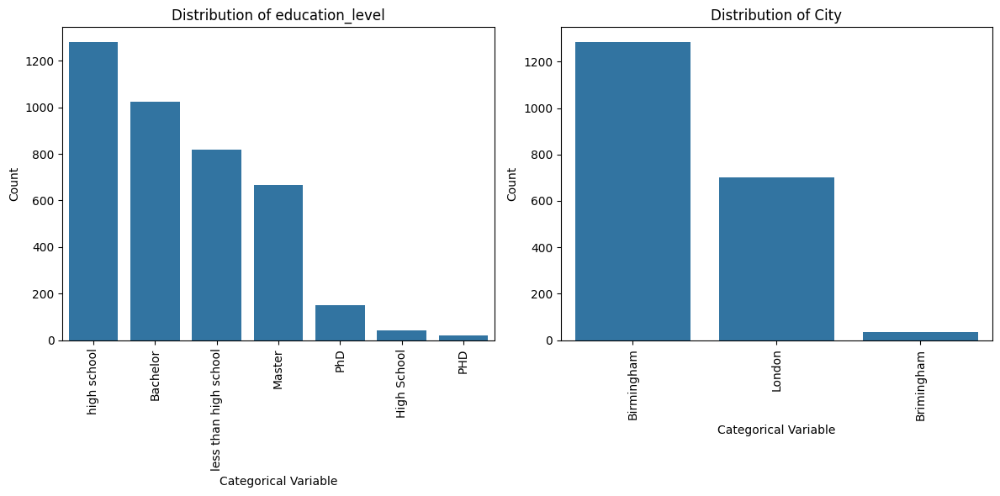

In [ ]:
# Remove 'name' col from categorical_columns list
categorical_columns.remove('name')
# Assuming your two categorical variables are stored in a list named categorical_list
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # Create a figure with two subplots

# Iterate over the categorical variables and plot them side by side
for i, cat_var in enumerate(categorical_columns):
    sns.countplot(x=cat_var, data=df, ax=axes[i], order=df[cat_var].value_counts().index)
    axes[i].set_xlabel('Categorical Variable')
    axes[i].set_ylabel('Count')
    axes[i].set_title(f'Distribution of {cat_var}')
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)  # Rotate x-axis labels

plt.tight_layout()  # Adjust the layout to prevent overlap of subplots
plt.show();

The chart for **'education_level'** shows the frequency count of each education level in the df:

- **'high school'** is the most common education level, followed by **'Bachelor'** and **'less than high school'**
- **'Master'** and **'PhD'** levels have fewer counts
- The bars for **'high school'** and **'High School'** shows inconsistency in the data, as well as **'PhD'** and **'PHD'**,       which will have to be corrected in order to accurately represent the data distribution
    
The **'City'** bars shows **'Birmingham'** at first place, with **'London'** being the second most common.

- There is also a small number of values for 'Brmingham', which is a misspelling of 'Birmingham'. These should be           corrected to 'Birmingham' to accurately represent the data.

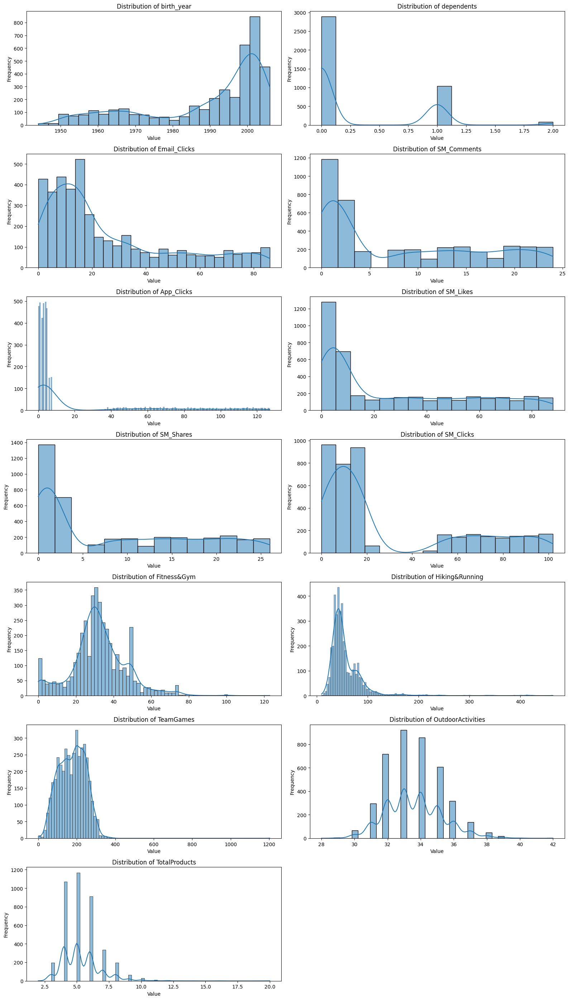

In [ ]:
# Identify the length of the list to calculate the subplots
num_vars = len(numerical_columns)
rows = (num_vars + 1) // 2

fig, axes = plt.subplots(rows, 2, figsize=(16, 4*rows))

# Iterate over numerical variables and plot their distribution in the subplot grid
for i, num_var in enumerate(numerical_columns):
    row_idx = i // 2
    col_idx = i % 2
    sns.histplot(df[num_var], kde=True, ax=axes[row_idx, col_idx])
    axes[row_idx, col_idx].set_xlabel('Value')
    axes[row_idx, col_idx].set_ylabel('Frequency')
    axes[row_idx, col_idx].set_title(f'Distribution of {num_var}')

# Remove empty subplot(s) if the number of numerical variables is odd
if num_vars % 2 != 0:
    fig.delaxes(axes[rows - 1, 1])

plt.tight_layout()
plt.show();

- **Distribution of birth_year**: The histogram shows a distribution that over several decades, so a large variaty of ages among our customers, with a higher frequency of younger individuals compared to older ones.
- **Distribution of dependents**: The histogram shows that a large number of individuals have zero dependents, and very few have one or two dependents.
- **Distribution of Email_Clicks, SM_Comments, App_Clicks, SM_Likes, SM_Shares, SM_Clicks**: These histograms appear to show various levels of engagement, with most showing a highly left-oriented distribution. This means that a large number of individuals have low engagement, with few individuals showing very high engagement levels.
- **Distribution of Fitness&Gym, Hiking&Running, TeamGames, OutdoorActivities**: The histograms for these variable vary. Some show a normal distribution, while others have a high pick. For instance, the distribution of Hiking&Running shows a very long right tail, representing extreme values or outliers.
- **Distribution of TotalProducts**: This histogram indicates that most individuals buy a relatively low number of total products, with the number of products per individual decreasing as the quantity increases.

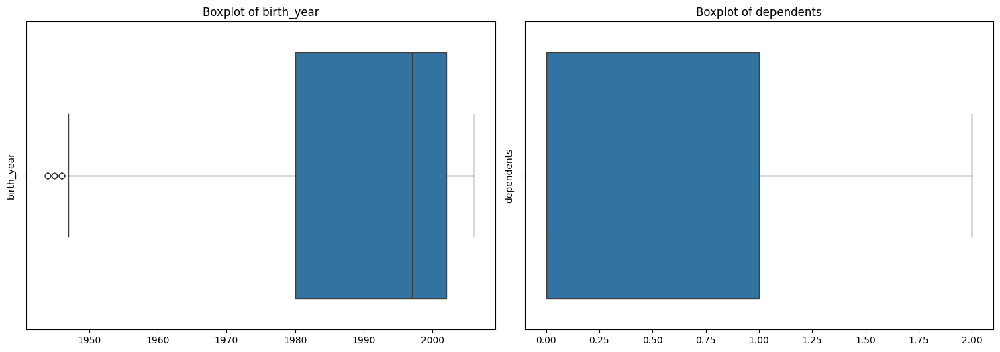

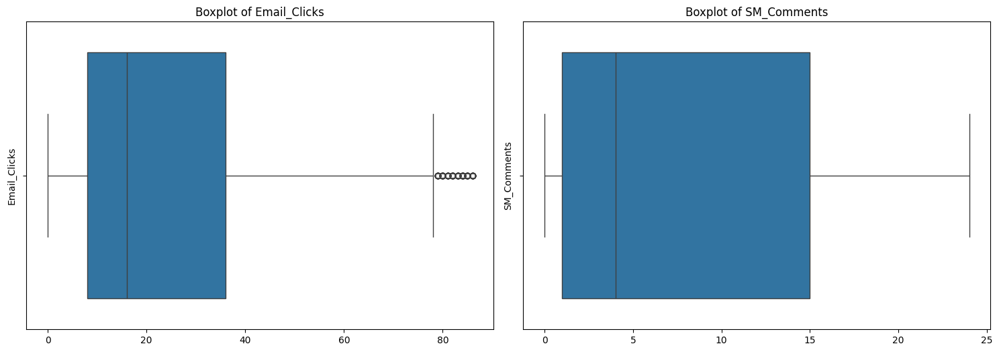

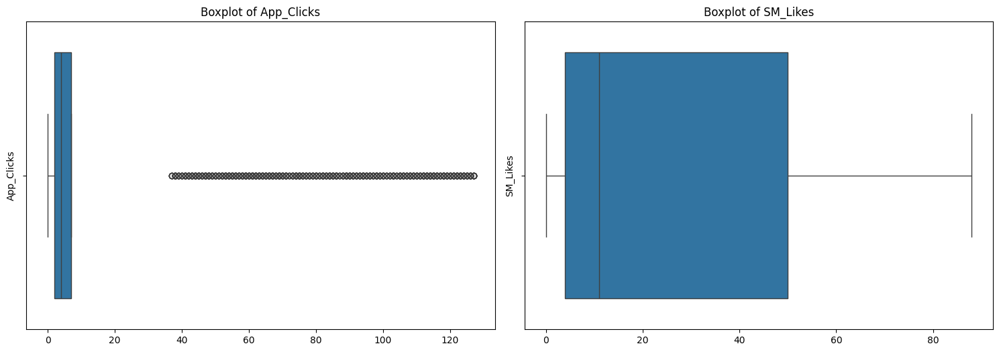

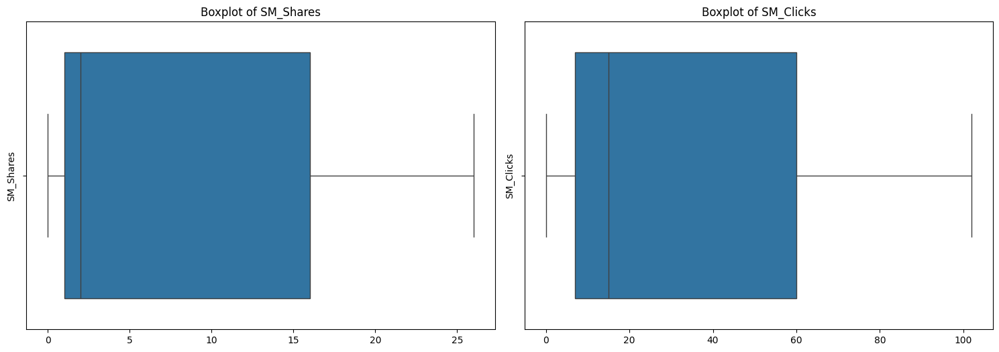

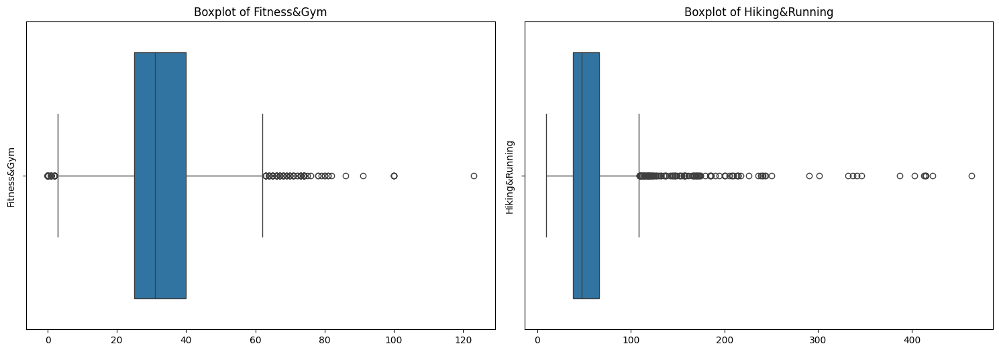

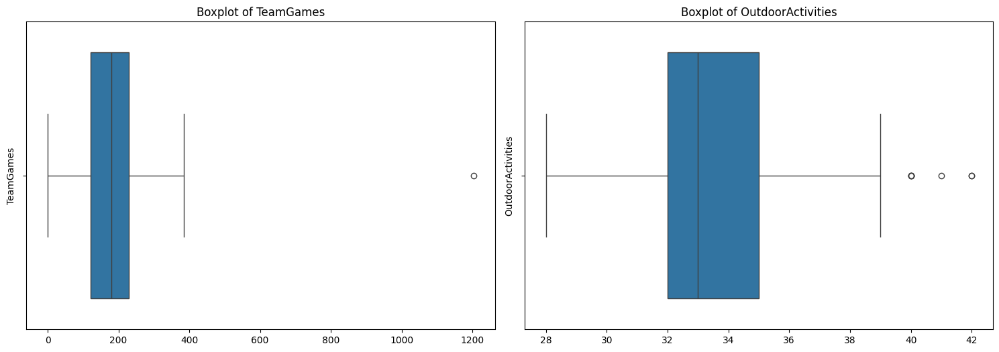

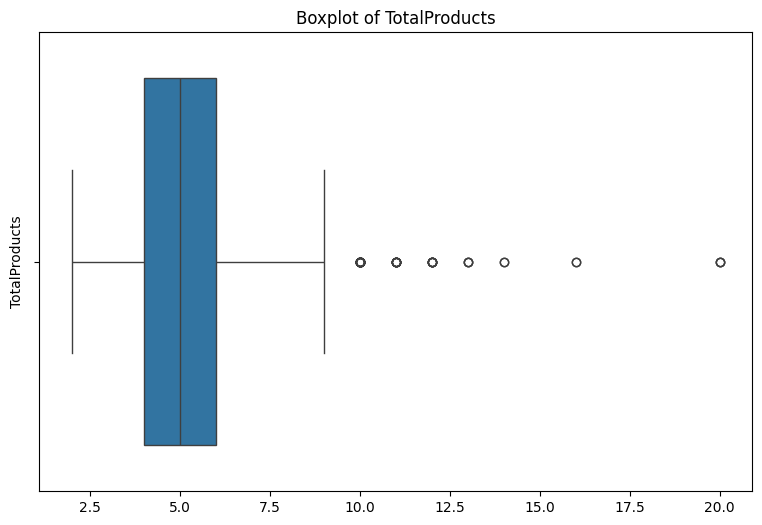

In [ ]:
# Plot box plots for each numerical variable
num_plots = len(numerical_columns)
num_plots_per_row = 2
num_rows = -(-num_plots // num_plots_per_row)

for i in range(0, num_plots, num_plots_per_row):
    plt.figure(figsize=(15, 5 * num_rows))
    for j, num_var in enumerate(numerical_columns[i:i+num_plots_per_row]):
        plt.subplot(num_rows, num_plots_per_row, j + 1)
        sns.boxplot(x=num_var, data=df)
        plt.title(f'Boxplot of {num_var}')
        plt.xlabel('')
        plt.ylabel(num_var)  # Set y-axis label to variable name
    plt.tight_layout()  # Adjust layout to prevent overlap of subplots
    plt.show()

- Boxplot of **birth_year**: This boxplot shows a wide range, indicating diversity in the ages of individuals within the dataset.
- There are a few outliers, representing older birth years.
- Boxplot of **dependents**: The 'dependents' boxplot shows that the majority of individuals have zero dependents
- Boxplot of **Email_Clicks**: There is a large number of outliers indicating individuals with an unusually high number of email clicks.
- Boxplot of **SM_Comments** & **App_Clicks** & **SM_Likes** & **SM_Clicks** & **SM_Shares**: The distribution is with most of the data concentrated at lower values and some outliers present.
- Boxplot of **Fitness&Gym & Hiking&Running**: Both these variables have a spread of data with several outliers, indicating that there are individuals with very high values compared to the rest.
- Boxplot of **TeamGames and OutdoorActivities**: These variables also display left-oriented distributions with a few outliers indicating higher values.
- Boxplot of **TotalProducts**:The data for TotalProducts show a noticeable right skew and some outliers.

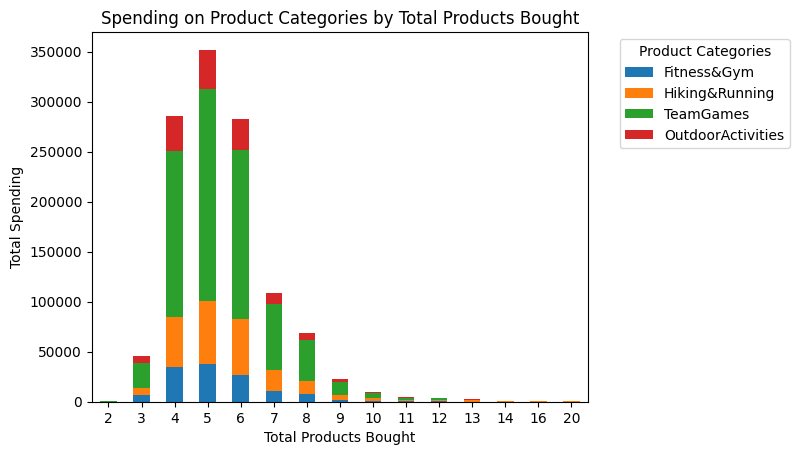

In [ ]:
stacked_data = df[['Fitness&Gym', 'Hiking&Running', 'TeamGames', 'OutdoorActivities', 'TotalProducts']]
stacked_data = stacked_data.groupby('TotalProducts').sum()
stacked_data.plot(kind='bar', stacked=True)
plt.title('Spending on Product Categories by Total Products Bought')
plt.xlabel('Total Products Bought')
plt.ylabel('Total Spending')
plt.legend(title='Product Categories', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0)  # Rotate x-axis labels for better visibility
plt.show()

- This visualization can help us understand how product purchasing is distributed across different categories as customers total products number increase.
- Conclusions: The spending in each category tends to increase with the total number of products bought, as normal. We notice that customers who buy more products spend especially more on certain categories, such as **TeamGames** and **Hiking&Running**

<Axes: >

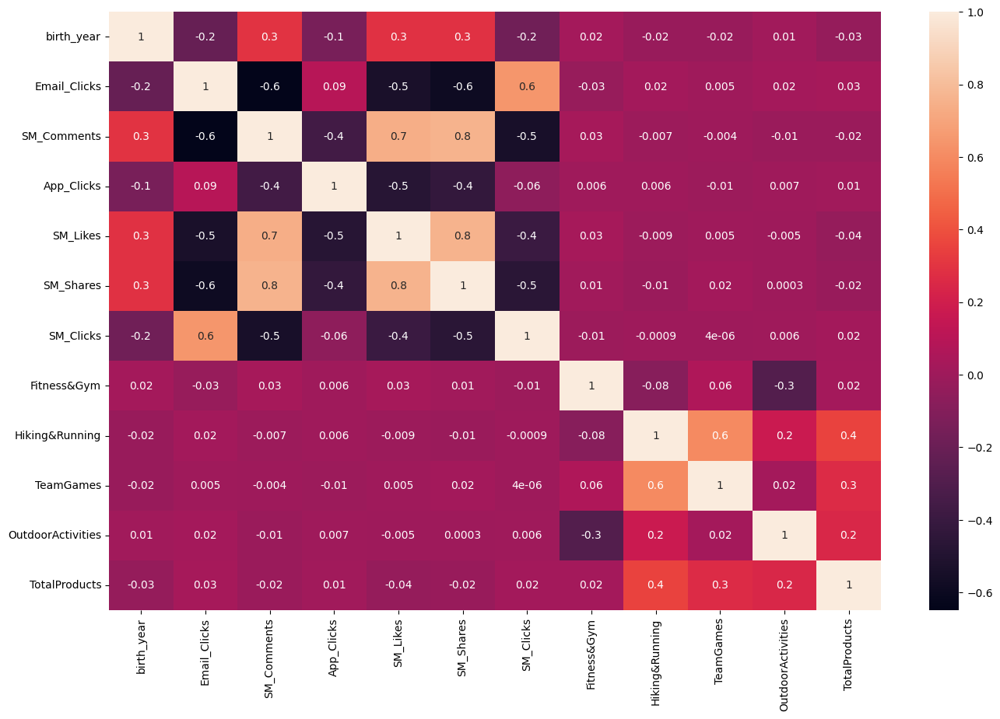

In [ ]:
# Drop rows with non-numeric values
df_numeric = df.select_dtypes(include='number')

# Drop binary variables
# axis = 1 -> remove columns. If 0, remove
df_spearman = df_numeric.drop(['dependents'], axis = 1)

# Calculate correlation matrix
# dy default the method is pearson. He have to write to choose spearman
df_corr = df_spearman.corr(method='spearman')
figure = plt.figure(figsize=(16,10))
sns.heatmap(df_corr, annot=True, fmt = '.1g')

In [ ]:
# Print the Spearman correlation matrix used in the heatmap
print("Spearman Correlation Matrix:")
print(df_corr)

Spearman Correlation Matrix:
                   birth_year  Email_Clicks  SM_Comments  App_Clicks  \
birth_year           1.000000     -0.216882     0.297037   -0.145071   
Email_Clicks        -0.216882      1.000000    -0.649542    0.093291   
SM_Comments          0.297037     -0.649542     1.000000   -0.360823   
App_Clicks          -0.145071      0.093291    -0.360823    1.000000   
SM_Likes             0.286478     -0.538896     0.741365   -0.480097   
SM_Shares            0.286683     -0.588584     0.760124   -0.429160   
SM_Clicks           -0.177595      0.643550    -0.540962   -0.062214   
Fitness&Gym          0.023624     -0.026547     0.030384    0.006422   
Hiking&Running      -0.020637      0.015600    -0.006620    0.006216   
TeamGames           -0.021370      0.005284    -0.003883   -0.009868   
OutdoorActivities    0.011520      0.021204    -0.014293    0.007332   
TotalProducts       -0.031202      0.029346    -0.015153    0.012137   

                   SM_Likes  SM_Sh

Spearman correlations conclusions:
-  **birth_year**: There are various small positive and negative correlations between 'birth_year' and other variables, but most seem to be very low (close to 0)
- **engagement variables**: There are some correlations among the social media engagement data. For instance, **'SM_Comments'** has a positive correlation with **'SM_Likes' and 'SM_Shares'**, suggesting that users who comment more also tend to like and share more
- **Product Categories** (Fitness&Gym, Hiking&Running, TeamGames and Outdoor Activities): **'Hiking&Running'** shows a moderate positive correlation with **'TotalProducts'**, which could mean that people who buy more products tend to be the ones that engage more in hiking and running activities

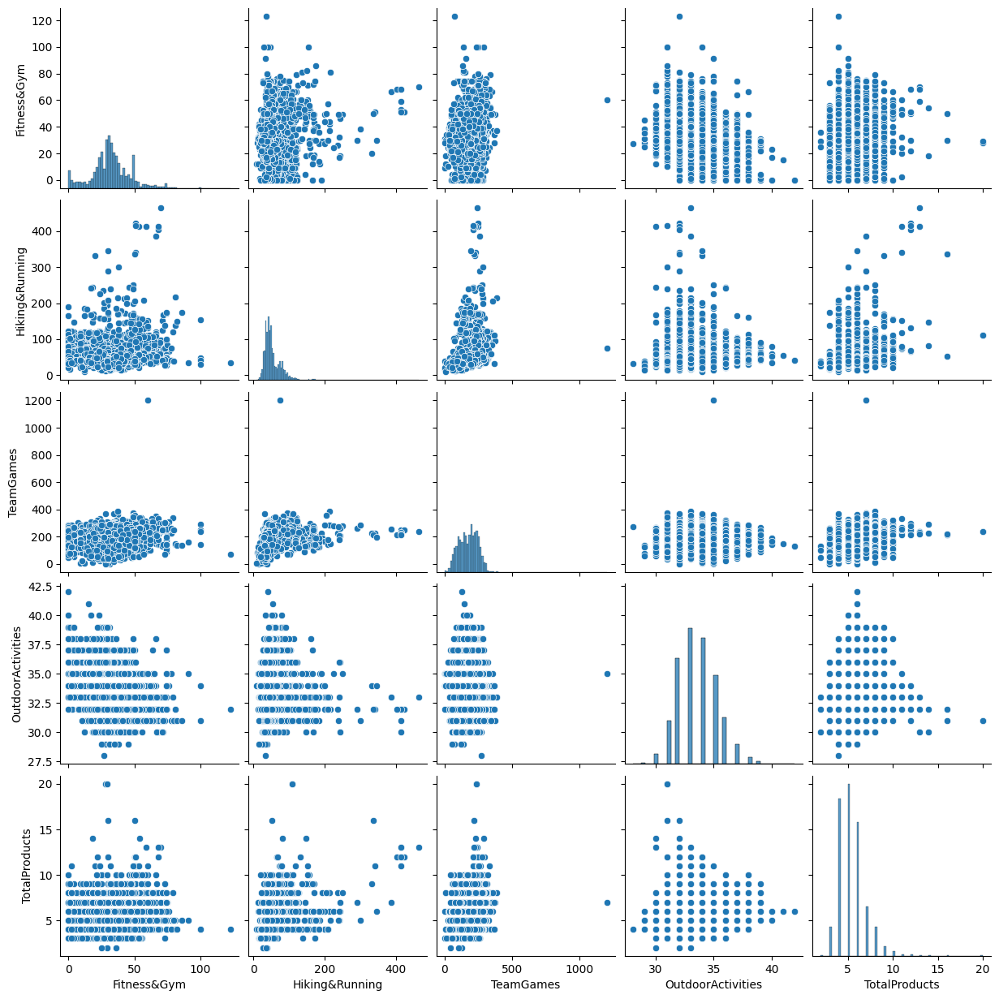

In [ ]:
# Create a pairplot to visualize pairwise relationships between variables in the products dataframe
products.set_index("Cust_ID", inplace = True)
sns.pairplot(products)
plt.show()

**TotalProducts** seems to have a positive correlation with **'TeamGames'** as the scatter plot between them shows a pattern that might indicate that teams who play more games might also purchase more products
Also we noticed that there may be a correlation between **'HikingRunning'** and **'OutdoorActivities'** as seen in the scatter plot that compares these two variables. The points seem to show a pattern from lower left to upper right, indicating that as participation in hiking and running increases, so might involvement in outdoor activities

In [ ]:
# Print descriptive statistics for each variable in the products dataframe
print("Descriptive Statistics for each variable in the 'products' DataFrame:")
stats_table = products.describe()
print(stats_table)

# Print the correlation matrix for the 'products' DataFrame
print("Correlation Matrix for the 'products' DataFrame:")
corr_matrix = products.corr()
print(corr_matrix)

Descriptive Statistics for each variable in the 'products' DataFrame:
       Fitness&Gym  Hiking&Running                  Last_Purchase  \
count  4000.000000     4000.000000                           4000   
mean     32.020250       55.844750  2024-01-30 18:50:02.399999744   
min       0.000000        9.000000            2023-10-15 00:00:00   
25%      25.000000       38.000000            2024-01-20 00:00:00   
50%      31.000000       47.000000            2024-02-01 00:00:00   
75%      40.000000       66.000000            2024-02-13 00:00:00   
max     123.000000      464.000000            2024-02-29 00:00:00   
std      14.469284       33.119109                            NaN   

         TeamGames  OutdoorActivities  TotalProducts  
count  4000.000000        4000.000000    4000.000000  
mean    176.085000          33.602750       5.329500  
min       0.000000          28.000000       2.000000  
25%     121.000000          32.000000       4.000000  
50%     180.000000          33.00

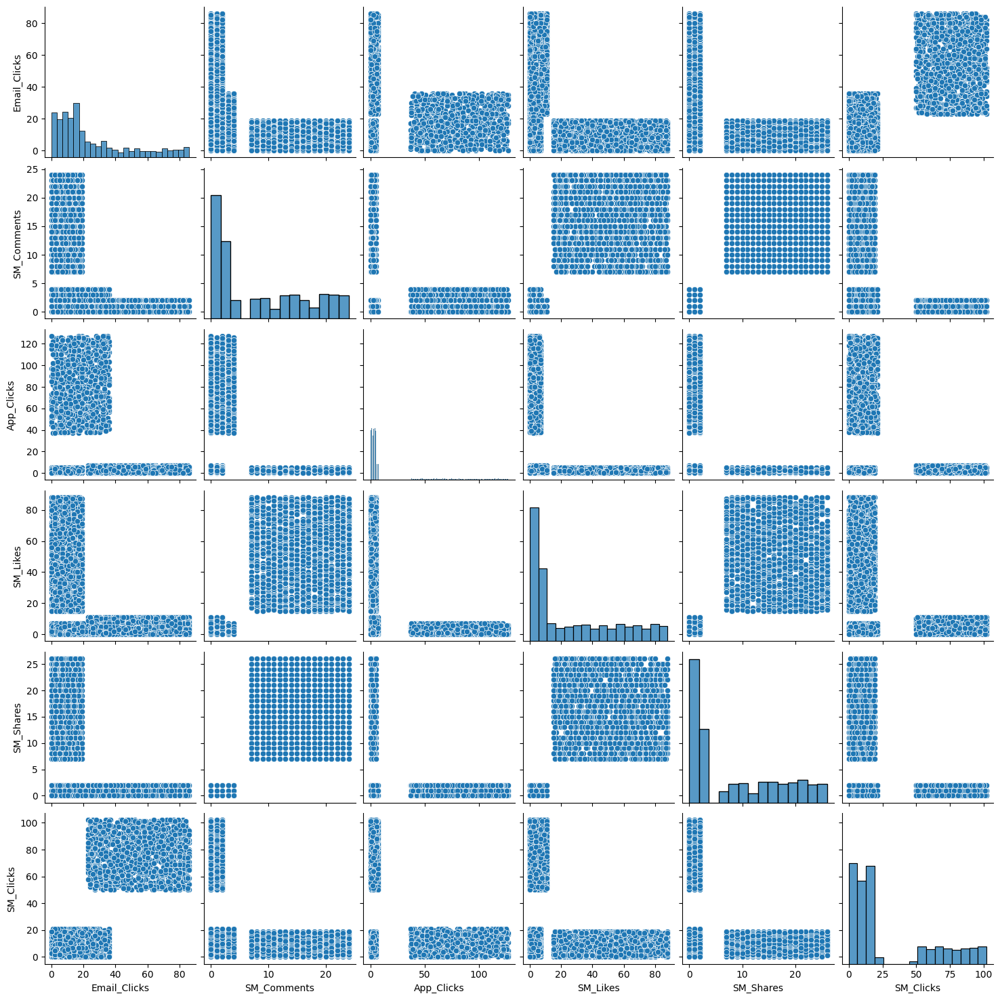

In [ ]:
# Create a pairplot to visualize pairwise relationships between variables in the digital dataframe
digital.set_index("Cust_ID", inplace = True)
sns.pairplot(digital)
plt.show()

In [ ]:
# Print descriptive statistics for each variable in the digital dataframe
print("Descriptive Statistics for each variable in the 'digital' DataFrame:")
stats_table = digital.describe()
print(stats_table)

# Print the correlation matrix for the 'digital' DataFrame
print("Correlation Matrix for the 'digital' DataFrame:")
corr_matrix = products.corr()
print(corr_matrix)

Descriptive Statistics for each variable in the 'digital' DataFrame:
       Email_Clicks  SM_Comments   App_Clicks     SM_Likes    SM_Shares  \
count    4000.00000  4000.000000  4000.000000  4000.000000  3961.000000   
mean       25.76225     8.247750    19.526500    26.957000     8.355971   
std        23.65998     8.064963    34.237945    27.742658     8.696192   
min         0.00000     0.000000     0.000000     0.000000     0.000000   
25%         8.00000     1.000000     2.000000     4.000000     1.000000   
50%        16.00000     4.000000     4.000000    11.000000     2.000000   
75%        36.00000    15.000000     7.000000    50.000000    16.000000   
max        86.00000    24.000000   127.000000    88.000000    26.000000   

         SM_Clicks  
count  4000.000000  
mean     30.349250  
std      32.254974  
min       0.000000  
25%       7.000000  
50%      15.000000  
75%      60.000000  
max     102.000000  
Correlation Matrix for the 'digital' DataFrame:
                  

We see that most of the scatterplots show a high concentration of points near the origin (0,0) and some plots show lacking areas indicating fewer users with high engagement levels.
The plots indicate varying levels of digital engagement among the individuals. Individuals with high **email clicks** don't necessarily have high **social media comments, likes, or shares**.

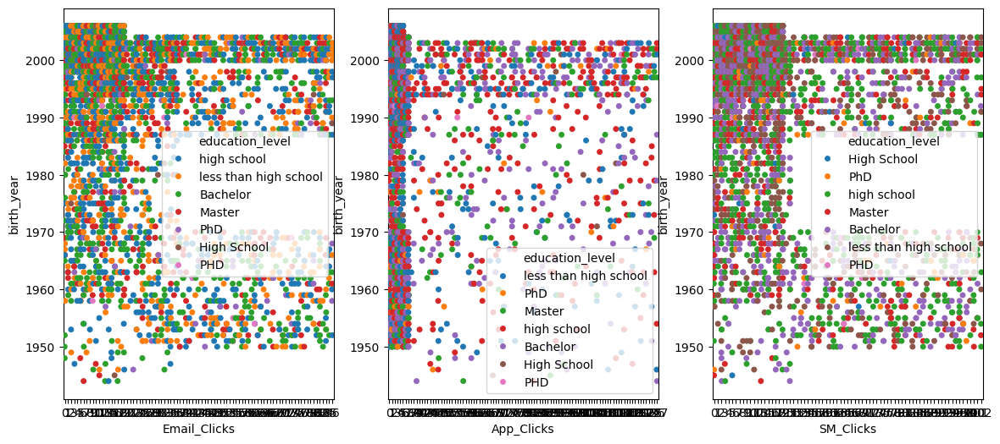

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(14, 6))

# Plot a stripplot on the first subplot (ax1) showing the relationship between 'Email_Clicks' and 'birth_year',
# with hue representing 'education_level'
sns.stripplot(ax=ax1, x='Email_Clicks', y='birth_year', data=df, hue='education_level')

# Plot a stripplot on the second subplot (ax2) showing the relationship between 'App_Clicks' and 'birth_year',
# with hue representing 'education_level'
sns.stripplot(ax=ax2, x='App_Clicks', y='birth_year', data=df, hue='education_level')

# Plot a stripplot on the third subplot (ax3) showing the relationship between 'SM_Clicks' and 'birth_year',
# with hue representing 'education_level'
sns.stripplot(ax=ax3, x='SM_Clicks', y='birth_year', data=df, hue='education_level');

We checked if there is any connection between birth_year, education_level and digital engagement that might help our analysis and the conclusion is that there is a wide distribution of engagement levels across different birth years, suggesting that digital engagement is common across all ages and also there is no clear pattern that links education level to a specific engagement metric, indicating that digital engagement is also not limited to any particular educational background.

In [ ]:
# Table for the stripplot of 'Email_Clicks' vs 'birth_year' colored by 'education_level'
email_clicks_table = df[['Email_Clicks', 'birth_year', 'education_level']]
print("Table for 'Email_Clicks' vs 'birth_year' with hue 'education_level':")
print(email_clicks_table.head())  # Displaying only the first few rows for brevity

# Table for the stripplot of 'App_Clicks' vs 'birth_year' colored by 'education_level'
app_clicks_table = df[['App_Clicks', 'birth_year', 'education_level']]
print("\nTable for 'App_Clicks' vs 'birth_year' with hue 'education_level':")
print(app_clicks_table.head())  # Displaying only the first few rows for brevity

# Table for the stripplot of 'SM_Clicks' vs 'birth_year' colored by 'education_level'
sm_clicks_table = df[['SM_Clicks', 'birth_year', 'education_level']]
print("\nTable for 'SM_Clicks' vs 'birth_year' with hue 'education_level':")
print(sm_clicks_table.head())  # Displaying only the first few rows for brevity


Table for 'Email_Clicks' vs 'birth_year' with hue 'education_level':
         Email_Clicks  birth_year        education_level
Cust_ID                                                 
4                  72        2002                 Master
5                  15        1994            high school
6                   9        2005                    PhD
9                  67        2003            high school
10                 38        2002  less than high school

Table for 'App_Clicks' vs 'birth_year' with hue 'education_level':
         App_Clicks  birth_year        education_level
Cust_ID                                               
4                 7        2002                 Master
5                 1        1994            high school
6                 3        2005                    PhD
9                 2        2003            high school
10                1        2002  less than high school

Table for 'SM_Clicks' vs 'birth_year' with hue 'education_level':
         SM_

Next we searched for a comparison between **birth year and SM_Shares** with a potential overlay of **TeamGames**. The concentration of points does not appear to show a clear trend or correlation between the variables. This uniform spread of dots suggests there might be no strong relationship between the birth year and the digital engagement variables of **Email_Clicks, SM_Shares and App_Clicks**, or between all these and the number of **TeamGames**.

In [ ]:
# Table for the stripplot of 'Email_Clicks' vs 'birth_year' colored by 'TeamGames'
email_clicks_team_games_table = df[['Email_Clicks', 'birth_year', 'TeamGames']]
print("Table for 'Email_Clicks' vs 'birth_year' with hue 'TeamGames':")
print(email_clicks_team_games_table.head())  # Displaying only the first few rows for brevity

# Table for the stripplot of 'App_Clicks' vs 'birth_year' colored by 'TeamGames'
app_clicks_team_games_table = df[['App_Clicks', 'birth_year', 'TeamGames']]
print("\nTable for 'App_Clicks' vs 'birth_year' with hue 'TeamGames':")
print(app_clicks_team_games_table.head())  # Displaying only the first few rows for brevity

# Table for the stripplot of 'SM_Clicks' vs 'birth_year' colored by 'TeamGames'
sm_clicks_team_games_table = df[['SM_Clicks', 'birth_year', 'TeamGames']]
print("\nTable for 'SM_Clicks' vs 'birth_year' with hue 'TeamGames':")
print(sm_clicks_team_games_table.head())  # Displaying only the first few rows for brevity


Table for 'Email_Clicks' vs 'birth_year' with hue 'TeamGames':
         Email_Clicks  birth_year  TeamGames
Cust_ID                                     
4                  72        2002        248
5                  15        1994        248
6                   9        2005        215
9                  67        2003        248
10                 38        2002        204

Table for 'App_Clicks' vs 'birth_year' with hue 'TeamGames':
         App_Clicks  birth_year  TeamGames
Cust_ID                                   
4                 7        2002        248
5                 1        1994        248
6                 3        2005        215
9                 2        2003        248
10                1        2002        204

Table for 'SM_Clicks' vs 'birth_year' with hue 'TeamGames':
         SM_Clicks  birth_year  TeamGames
Cust_ID                                  
4               73        2002        248
5               16        1994        248
6               10        2005

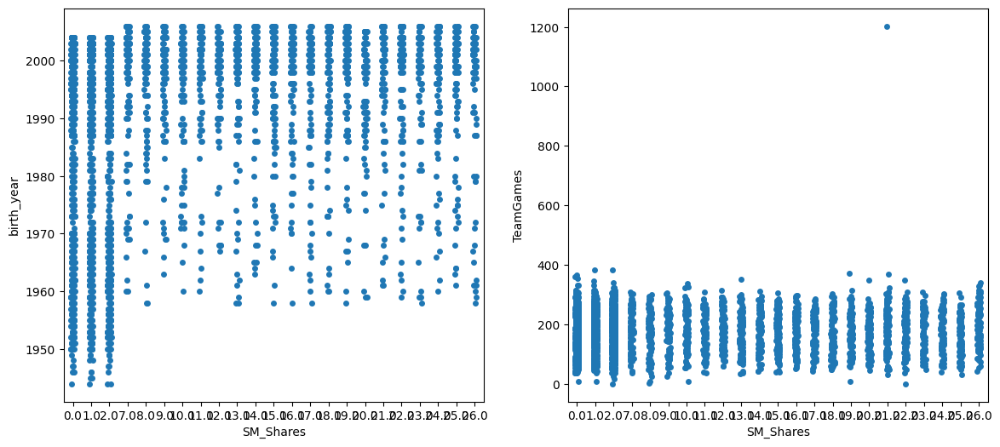

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot a stripplot on the first subplot (ax1) showing the relationship between 'SM_Shares' and 'birth_year'
sns.stripplot(ax=ax1, x='SM_Shares', y='birth_year', data=df)

# Plot a stripplot on the second subplot (ax2) showing the relationship between 'SM_Shares' and 'TeamGames'
sns.stripplot(ax=ax2, x='SM_Shares', y='TeamGames', data=df);

In [ ]:
# Table for the stripplot showing 'SM_Shares' vs 'birth_year'
sm_shares_birth_year_table = df[['SM_Shares', 'birth_year']]
print("Table for 'SM_Shares' vs 'birth_year':")
print(sm_shares_birth_year_table.head())  # Displaying only the first few rows for brevity

# Table for the stripplot showing 'SM_Shares' vs 'TeamGames'
sm_shares_team_games_table = df[['SM_Shares', 'TeamGames']]
print("\nTable for 'SM_Shares' vs 'TeamGames':")
print(sm_shares_team_games_table.head())  # Displaying only the first few rows for brevity

Table for 'SM_Shares' vs 'birth_year':
         SM_Shares  birth_year
Cust_ID                       
4              1.0        2002
5             15.0        1994
6             19.0        2005
9              1.0        2003
10             0.0        2002

Table for 'SM_Shares' vs 'TeamGames':
         SM_Shares  TeamGames
Cust_ID                      
4              1.0        248
5             15.0        248
6             19.0        215
9              1.0        248
10             0.0        204


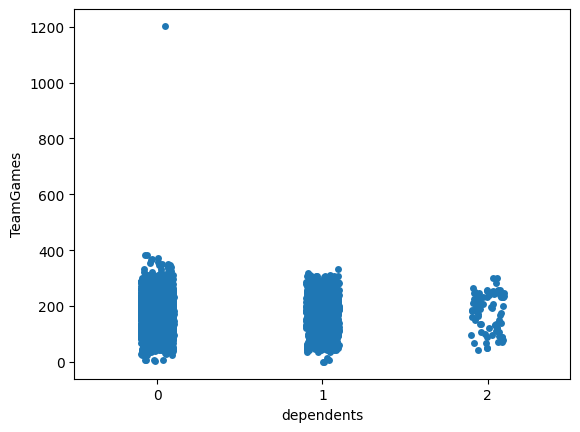

In [ ]:
# Plot a stripplot to visualize the relationship between the number of dependents and participation in team games
sns.stripplot(x='dependents', y='TeamGames', data=df);

In [ ]:
# Table for the stripplot showing 'dependents' vs 'TeamGames'
dependents_team_games_table = df[['dependents', 'TeamGames']]
print("Table for 'dependents' vs 'TeamGames':")
print(dependents_team_games_table.head())  # Displaying only the first few rows for brevity

Table for 'dependents' vs 'TeamGames':
         dependents  TeamGames
Cust_ID                       
4                 1        248
5                 0        248
6                 1        215
9                 0        248
10                0        204


Checking the connection between **dependents and TeamGames** variables, the conclusion was that regardless of the number of dependents, there are similar distributions for the number of **TeamGames** purchases, even if there is an outlier for individuals with no dependents.

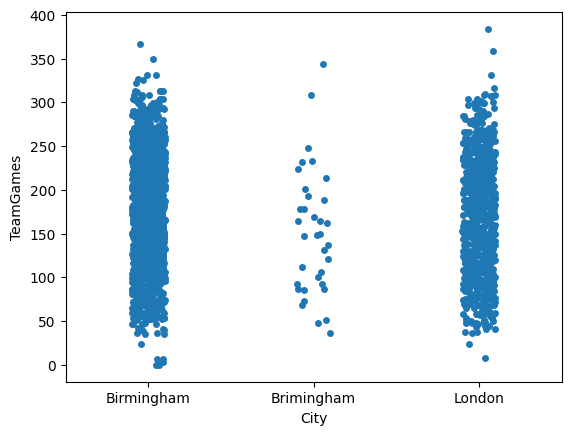

In [ ]:
# Plot a stripplot to visualize the relationship between the city and participation in team games
sns.stripplot(x='City', y='TeamGames', data=df);

In [ ]:
# Table for the stripplot showing 'City' vs 'TeamGames'
city_team_games_table = df[['City', 'TeamGames']]
print("Table for 'City' vs 'TeamGames':")
print(city_team_games_table.head())  # Displaying only the first few rows for brevity

Table for 'City' vs 'TeamGames':
               City  TeamGames
Cust_ID                       
4               NaN        248
5        Birmingham        248
6               NaN        215
9               NaN        248
10              NaN        204


<Axes: xlabel='dependents', ylabel='birth_year'>

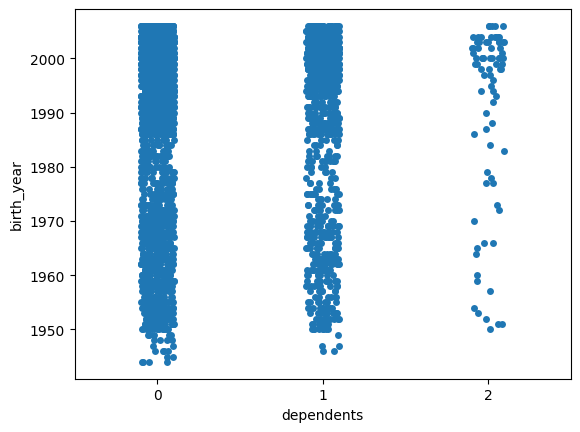

In [ ]:
sns.stripplot(x = 'dependents', y = 'birth_year', data = df)

The distribution is mostly consistent across different numbers of dependents and along the years

In [ ]:
df.shape

(4000, 17)

<font color = '#BED62F'>
    
# **3. Perform Changes** </font>

The preprocessing stage aimed to improve dataset reliability through corrections in data inconsistencies, managing missing values, and removing outliers. These steps ensure the data is robust and ready for analysis, addressing issues in key fields like 'education_level', 'City', and 'dependents'.

## 3.1 Outlier Removal Process

Outliers in **"Hiking&Running"** identified by values greater than 400.

Removal: Rows with **'Fitness&Gym' > 120, 'Hiking&Running' > 422, 'TeamGames' > 1000, or 'TotalProducts' > 18** are removed.

Boxplots are used to visually confirm the removal of outliers in 'Fitness&Gym', 'Hiking&Running', 'TeamGames', and 'TotalProducts'.

Kurtosis comparison before and after outlier removal is used to assess changes in the distribution tails, indicating a reduction in extreme values.

Fitness&Gym: Kurtosis reduced to 1.158913, signaling a shift towards normal distribution.
Hiking&Running: Despite a reduction to 35.075221, the kurtosis remains high, indicating heavy tails.
TeamGames: Now with negative kurtosis (-0.785208), indicating lighter tails than a normal distribution.
TotalProducts: Decrease in kurtosis to 3.472064 shows a move towards a more normal distribution.

In [ ]:
#Identify value for outliers in "Hiking&Running"
products.loc[products['Hiking&Running'] > 400].sort_values(by='Hiking&Running', ascending = False)

,Fitness&Gym,Hiking&Running,Last_Purchase,TeamGames,OutdoorActivities,TotalProducts
Cust_ID,,,,,,
81,70,464,2024-02-08,239,33,13
692,51,422,2024-02-14,250,32,12
1370,51,415,2024-02-18,211,31,12
1051,59,414,2024-02-14,230,32,13
1319,68,414,2024-02-12,218,30,13
451,53,413,2024-02-21,250,32,11
1260,68,403,2024-02-11,214,32,12


In [ ]:
#remove outliers
df = df.drop(df[(df['Fitness&Gym'] > 120) | (df['Hiking&Running'] > 422) | (df['TeamGames'] > 1000) | (df['TotalProducts'] > 18)].index)

<Axes: xlabel='TotalProducts'>

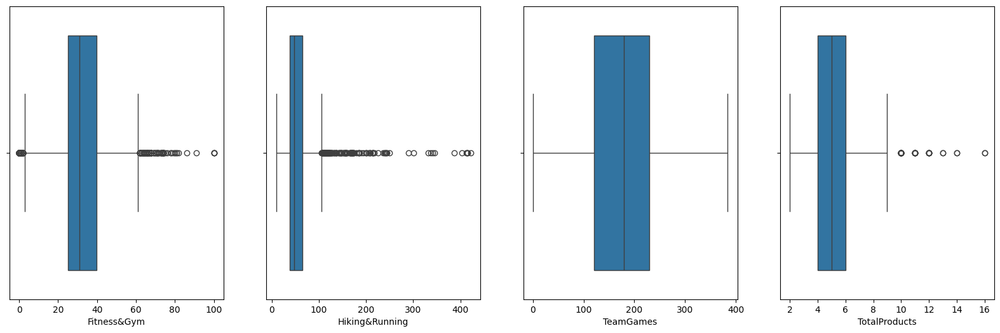

In [ ]:
fig, (ax1, ax2, ax3,ax4) = plt.subplots(1,4, figsize = (20,6))
sns.boxplot(ax = ax1, data = df, x = 'Fitness&Gym')
sns.boxplot(ax = ax2, data = df, x = 'Hiking&Running')
sns.boxplot(ax = ax3, data = df, x = 'TeamGames')
sns.boxplot(ax = ax4, data = df, x = 'TotalProducts')

In [ ]:
df.shape

(3994, 17)

In [ ]:
print("Before:\n", products[['Fitness&Gym',	'Hiking&Running',	'TeamGames',	'OutdoorActivities',	'TotalProducts']].kurt())
print("\nAfter:\n", df[['Fitness&Gym',	'Hiking&Running',	'TeamGames',	'OutdoorActivities',	'TotalProducts']].kurt())

Before:
 Fitness&Gym           1.464810
Hiking&Running       37.839539
TeamGames            10.605494
OutdoorActivities     0.399144
TotalProducts         9.247286
dtype: float64

After:
 Fitness&Gym           1.158913
Hiking&Running       35.075221
TeamGames            -0.785208
OutdoorActivities     0.402278
TotalProducts         3.472064
dtype: float64


## **3.2. Data Inconsistencies**

### 3.2.1 Correct 'education_level'

- Normalizes the values in the 'education_level' column by correcting the capitalization for 'High School' and standardizing the abbreviation for 'PhD'.
- Outputs the corrected distribution and the total count to verify changes.

In [ ]:
# Capitalize the first letter of each word in 'education_level'
df['education_level'] = df['education_level'].str.title()
df['education_level'] = df['education_level'].replace('Phd', 'PhD')
# Verify the changes by looking at the unique values and their counts
print(df['education_level'].value_counts())
df['education_level'].count()

education_level
High School              1321
Bachelor                 1022
Less Than High School     817
Master                    663
PhD                       171
Name: count, dtype: int64


3994

### 3.2.2 Correct 'City'

- Corrects a common misspelling in the 'City' column ('Brimingham' to 'Birmingham').
- Displays the updated city distribution and total record count to ensure completeness.

In [ ]:
df['City'] = df['City'].replace(to_replace = 'Brimingham',value = 'Birmingham')
print(df['City'].value_counts())
df['City'].count()

City
Birmingham    1318
London         699
Name: count, dtype: int64


2017

### **3.2.3 Correct 'Dependents'**

- Addresses a potential data entry error in the 'dependents' column where '2' is assumed to be incorrect and is replaced by '1'.
- Provides the revised counts of dependents and total entries to confirm the adjustment.

In [ ]:
df['dependents'].value_counts()

dependents
0    2881
1    1034
2      79
Name: count, dtype: int64

In [ ]:
df['dependents'] = df['dependents'].replace(to_replace = 2,value = 1)
print(df['dependents'].value_counts())
df['dependents'].count()


dependents
0    2881
1    1113
Name: count, dtype: int64


3994

## **3.3 Missing Values**

- Initial Overview: Reports initial missing values across columns.
- Filling Missing 'City' Values: Assigns 'unknown' to missing entries in the 'City' column to maintain complete geographic data.
- Data Preparation for Imputation: Excludes rows with missing social media metrics to create a clean subset for model training.
- Model-Based Imputation: Uses a K-Nearest Neighbors regression to predict and impute missing 'SM_Shares' values based on similar data points.
- Updating the Dataset: Applies model predictions to fill missing 'SM_Shares' and confirms the reduction of missing values post-imputation

In [ ]:
df.isna().sum()

name                    0
birth_year              0
education_level         0
dependents              0
City                 1977
Email_Clicks            0
SM_Comments             0
App_Clicks              0
SM_Likes                0
SM_Shares              39
SM_Clicks               0
Fitness&Gym             0
Hiking&Running          0
Last_Purchase           0
TeamGames               0
OutdoorActivities       0
TotalProducts           0
dtype: int64

In [ ]:
df['City'].fillna('unknown', inplace = True)
df['City'].value_counts()

City
unknown       1977
Birmingham    1318
London         699
Name: count, dtype: int64

In [ ]:
df.isna().sum()

name                  0
birth_year            0
education_level       0
dependents            0
City                  0
Email_Clicks          0
SM_Comments           0
App_Clicks            0
SM_Likes              0
SM_Shares            39
SM_Clicks             0
Fitness&Gym           0
Hiking&Running        0
Last_Purchase         0
TeamGames             0
OutdoorActivities     0
TotalProducts         0
dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor

complete_data = df.dropna(subset=['SM_Clicks', 'SM_Likes', 'SM_Comments', 'SM_Shares'])


X_train, X_test, y_train, y_test = train_test_split(complete_data[['SM_Clicks', 'SM_Likes', 'SM_Comments']], complete_data['SM_Shares'], test_size=0.2, random_state=42)

# Training KNN
knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train, y_train)

# Missing values
X_missing = df[['SM_Clicks', 'SM_Likes', 'SM_Comments']][df['SM_Shares'].isna()]
predicted_shares = knn_model.predict(X_missing)

# Update df with values
df.loc[df['SM_Shares'].isnull(), 'SM_Shares'] = predicted_shares
df.isna().sum()

name                 0
birth_year           0
education_level      0
dependents           0
City                 0
Email_Clicks         0
SM_Comments          0
App_Clicks           0
SM_Likes             0
SM_Shares            0
SM_Clicks            0
Fitness&Gym          0
Hiking&Running       0
Last_Purchase        0
TeamGames            0
OutdoorActivities    0
TotalProducts        0
dtype: int64

<font color = '#BED62F'>
    
# **4. Feature Engineering** </font>

Feature engineering transforms raw data into useful features for modeling. This includes generating new variables, encoding categories, pruning, and scaling data to standardize feature ranges, ensuring uniform influence in model predictions.




## **4.1. Create new variables**

### **4.1.1 'male'**

In [ ]:
df['male'] = df['name'].apply(lambda x: 1 if x.startswith('Mr') else 0)
df['male'].value_counts()

male
0    2365
1    1629
Name: count, dtype: int64

At this point we decided to create a binary variable from gender inputs as follows: 1 for Male (gender "M") inputs and 0 for others Female (gender "F")

### **4.1.2 'Gender'**

In [ ]:
df["Gender"]=df["male"].map({0:"F",1:"M"})

### **4.1.3 'Age'**

In [ ]:
from datetime import date
df['Age'] = date.today().year - df['birth_year']
df['Age'].value_counts()

Age
21    306
22    271
23    267
24    254
20    215
26    188
25    185
19    124
18    114
28    109
27    108
30    105
29    101
37     84
33     78
31     70
34     67
32     64
36     62
35     60
38     51
55     47
56     47
59     44
57     44
66     43
63     43
62     42
61     42
58     38
54     37
71     36
70     36
64     35
65     35
72     34
69     32
60     31
52     30
73     30
42     27
67     27
51     26
53     25
47     24
74     23
49     23
45     22
41     20
68     20
43     19
44     19
50     18
40     18
48     17
46     16
39     15
78      6
75      6
76      4
80      4
77      4
79      2
Name: count, dtype: int64

We created a new column called 'Age' and calculated by subtracting the birth year of each individual from the current year

In [ ]:
df.columns

Index(['name', 'birth_year', 'education_level', 'dependents', 'City',
       'Email_Clicks', 'SM_Comments', 'App_Clicks', 'SM_Likes', 'SM_Shares',
       'SM_Clicks', 'Fitness&Gym', 'Hiking&Running', 'Last_Purchase',
       'TeamGames', 'OutdoorActivities', 'TotalProducts', 'male', 'Gender',
       'Age'],
      dtype='object')

<Axes: xlabel='Age'>

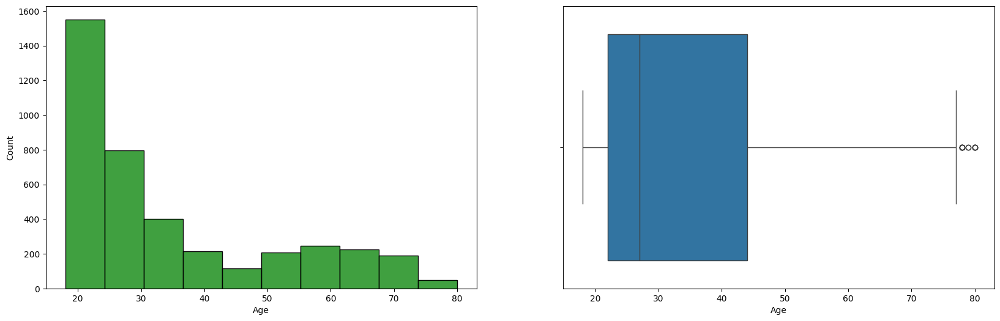

In [ ]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (20,6))
sns.histplot(ax = ax1, data = df, x = 'Age', color="g", bins = 10)
sns.boxplot(ax = ax2, data = df, x = 'Age')

The histogram represents the distribution of ages within the df. Each bar represents an age interval, and its height indicates the frequency of customers within that age range. The concentration of taller bars on the left suggests a younger customer base
The boxplot shows a visual summary of the age distribution and highlights the median and any potential outliers. The plot shows a relatively young customer range with a median age around 30. The presence of outliers suggests there are customers significantly older than the main customer base.

<Axes: xlabel='Age', ylabel='TeamGames'>

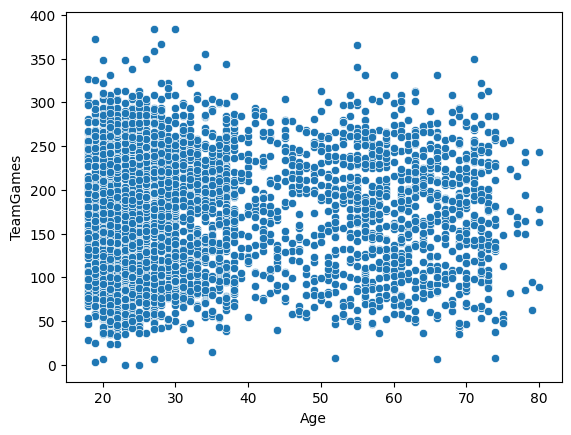

In [ ]:
sns.scatterplot(data = df, x = 'Age', y= 'TeamGames')

This scatterplot shows the relationship between **age** and the number of **TeamGames** products purchased. It seems there is no clear trend, suggesting that age may not be a strong reference of the number of TeamGames products a customer purchases

In [ ]:
df.shape

(3994, 20)

We have now a df of 3994 rows and 19 columns, indicating that the data has been processed since the original data contained 4000 inputs

### **4.1.4 'Recency'**

We transformed Last_Purchase into datetime format and calculated **'Recency'** to track recent customer activity.
Removed records with Recency **over 180 days** to focus on active customers.

In [ ]:
df['Last_Purchase'] = pd.to_datetime(df['Last_Purchase'])
today_date = pd.Timestamp(date.today())
df['Recency'] = (today_date - df['Last_Purchase']).dt.days

<Axes: xlabel='Recency'>

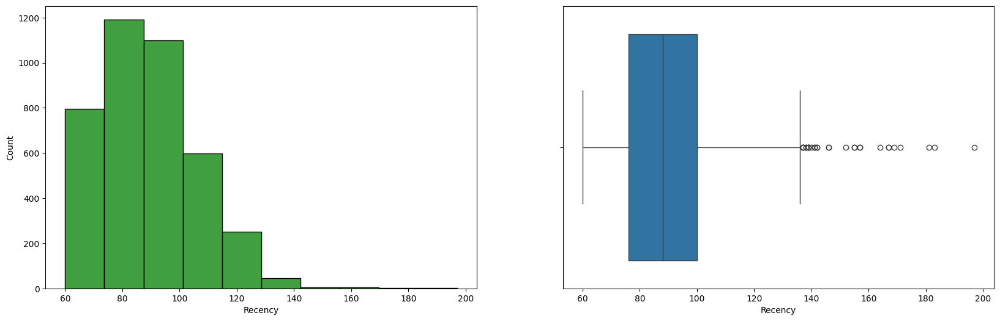

In [ ]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize = (20,6))
sns.histplot(ax = ax1, data = df, x = 'Recency', color="g", bins = 10)
sns.boxplot(ax = ax2, data = df, x = 'Recency')

The histogram we created displays the distribution of **'Recency'**, a new calculated variable as the number of days since the last purchase. The histogram shows a left-oriented distribution, indicating that most customers have made a purchase relatively recently, with fewer customers having a longer gap since their last purchase
The boxplot shows the same 'Recency' variable, there appear to be a small number of customers with very high 'Recency' values, outside the rest of the distribution

In [ ]:
df = df.drop(df[(df['Recency'] > 190)].index)

In [ ]:
df.shape

(3993, 21)

In [ ]:
df.columns

Index(['name', 'birth_year', 'education_level', 'dependents', 'City',
       'Email_Clicks', 'SM_Comments', 'App_Clicks', 'SM_Likes', 'SM_Shares',
       'SM_Clicks', 'Fitness&Gym', 'Hiking&Running', 'Last_Purchase',
       'TeamGames', 'OutdoorActivities', 'TotalProducts', 'male', 'Gender',
       'Age', 'Recency'],
      dtype='object')

## **4.2 Categorical Encoding**

- Ordinal encoded education_level and one-hot encoded City, enhancing model input with numerical data.
- Dropped less informative columns like City_unknown to avoid the dummy variable trap.

In [ ]:
df['education_level_encoded'] = df['education_level'].replace('Less Than High School',0).replace('High School',1).replace('Bachelor',2).replace('Master',3).replace('PhD',4)

In [ ]:
df['education_level'].value_counts()

education_level
High School              1321
Bachelor                 1022
Less Than High School     816
Master                    663
PhD                       171
Name: count, dtype: int64

In [ ]:
df['education_level_encoded'].value_counts()

education_level_encoded
1    1321
2    1022
0     816
3     663
4     171
Name: count, dtype: int64

In [ ]:
df.dtypes

name                               object
birth_year                          int64
education_level                    object
dependents                          int64
City                               object
Email_Clicks                        int64
SM_Comments                         int64
App_Clicks                          int64
SM_Likes                            int64
SM_Shares                         float64
SM_Clicks                           int64
Fitness&Gym                         int64
Hiking&Running                      int64
Last_Purchase              datetime64[ns]
TeamGames                           int64
OutdoorActivities                   int64
TotalProducts                       int64
male                                int64
Gender                             object
Age                                 int64
Recency                             int64
education_level_encoded             int64
dtype: object

In [ ]:
df = pd.get_dummies(df, columns=['City'])
columns_to_convert = ['City_Birmingham', 'City_London', 'City_unknown']
#coverter True/False para 1/0
df[columns_to_convert] = df[columns_to_convert].astype(int)

We performed the creation of dummies from **City** variable, **City_Birmingham', 'City_London', 'City_unknown'**

In [ ]:
df.drop(columns=['City_unknown'], inplace=True)

As we had the missing values in the original **City** variable that is not usefull of the further analysis, we decided to drop the new column **City_unknown**

In [ ]:
df.columns

Index(['name', 'birth_year', 'education_level', 'dependents', 'Email_Clicks',
       'SM_Comments', 'App_Clicks', 'SM_Likes', 'SM_Shares', 'SM_Clicks',
       'Fitness&Gym', 'Hiking&Running', 'Last_Purchase', 'TeamGames',
       'OutdoorActivities', 'TotalProducts', 'male', 'Gender', 'Age',
       'Recency', 'education_level_encoded', 'City_Birmingham', 'City_London'],
      dtype='object')

In [ ]:
bins = [18, 25, 35, 45, 55, 65, 81]
labels = ['18-24 Years', '25-34 Years', '35-44 Years', '45-54 Years', '55-64 Years', '65-80 Years']
df['age_group'] = pd.cut(df['Age'], bins=bins, labels=labels, right=False)

In [ ]:
df['age_group']

Cust_ID
4       18-24 Years
5       25-34 Years
6       18-24 Years
9       18-24 Years
10      18-24 Years
11      18-24 Years
12      18-24 Years
15      65-80 Years
18      25-34 Years
19      25-34 Years
20      25-34 Years
21      35-44 Years
24      18-24 Years
25      25-34 Years
28      25-34 Years
30      18-24 Years
31      65-80 Years
33      18-24 Years
35      45-54 Years
36      45-54 Years
42      18-24 Years
43      65-80 Years
44      18-24 Years
45      18-24 Years
46      18-24 Years
48      18-24 Years
50      25-34 Years
58      18-24 Years
59      18-24 Years
61      25-34 Years
62      45-54 Years
63      18-24 Years
65      35-44 Years
66      25-34 Years
67      18-24 Years
68      18-24 Years
72      65-80 Years
73      18-24 Years
74      25-34 Years
75      55-64 Years
77      18-24 Years
79      65-80 Years
80      25-34 Years
84      55-64 Years
85      25-34 Years
94      25-34 Years
95      65-80 Years
97      55-64 Years
98      35-44 Years
100     25-3

In [ ]:
age_group_encoded = {'18-24 Years': 0, '25-34 Years': 1, '35-44 Years': 2, '45-54 Years': 3, '55-64 Years': 4, '65-80 Years': 5}
df['age_group_encoded'] = df['age_group'].map(age_group_encoded)

In [ ]:
df['age_group_encoded'] = df['age_group_encoded'].astype("int64")

- Numerically encoded age groups to streamline usage in predictive modeling, eliminating the original Age field to reduce redundancy.
- This streamlined feature set is tailored to improve model accuracy and efficiency, focusing on variables that directly impact the analytical outcomes.

In [ ]:
df.dtypes

name                               object
birth_year                          int64
education_level                    object
dependents                          int64
Email_Clicks                        int64
SM_Comments                         int64
App_Clicks                          int64
SM_Likes                            int64
SM_Shares                         float64
SM_Clicks                           int64
Fitness&Gym                         int64
Hiking&Running                      int64
Last_Purchase              datetime64[ns]
TeamGames                           int64
OutdoorActivities                   int64
TotalProducts                       int64
male                                int64
Gender                             object
Age                                 int64
Recency                             int64
education_level_encoded             int64
City_Birmingham                     int64
City_London                         int64
age_group                        c

## **4.3. Power Transform**


Power transforms are utilized to address skewness in data distributions, such as 'Hiking&Running'. These transformations, specifically square root and cube root, modify data to enhance normality, thus preparing it for effective KMeans application, which assumes multivariate normality for optimal results.

Analysis:

Square Root Transformation is often used to reduce right skewness in the data. It tends to compress higher values more than lower values, making it effective for data with large outliers or extreme values. However, the square root transformation may not be as effective for highly skewed data with heavy tails or very large outliers, as it doesn't provide as much compression as other transformations like the cube root or logarithmic transformation.

Cube Root Transformation is more effective at reducing skewness and compressing extreme values compared to the square root transformation. It provides greater compression for higher values while still preserving the order of magnitude. The cube root transformation is often used when data exhibit moderate to high skewness or have heavy-tailed distributions. It can help stabilize variances and improve the symmetry of the data distribution.

In [ ]:
# Calculating initial kurtosis to understand data skewness
df['Hiking&Running'].kurt()

35.06841900610191

In [ ]:
# Applying Square Root Transformation
df['sqrt_Hiking&Running'] = np.sqrt(df['Hiking&Running'])
df['sqrt_Hiking&Running'].kurt()

9.106920203899872

In [ ]:
# Applying Cube Root Transformation
df['cuberoot_Hiking&Running'] = df['Hiking&Running'] ** (1/3)
df['cuberoot_Hiking&Running'].kurt()

5.470406228910519

In [ ]:
df['sevenroot_Hiking&Running'] = df['Hiking&Running'] ** (1/7)
df['sevenroot_Hiking&Running'].kurt()

2.956092670735009

<Axes: xlabel='sevenroot_Hiking&Running', ylabel='Count'>

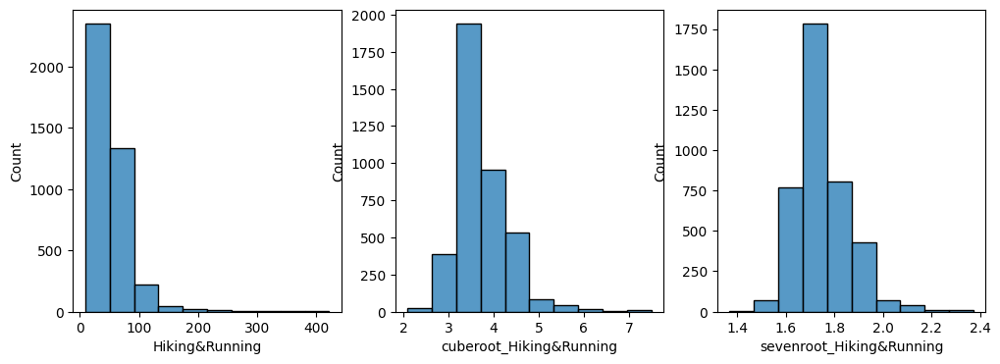

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (12,4))
sns.histplot(ax = ax1, data = df, x = 'Hiking&Running', bins = 10)
sns.histplot(ax = ax2, data = df, x = 'cuberoot_Hiking&Running', bins = 10)
sns.histplot(ax = ax3, data = df, x = 'sevenroot_Hiking&Running', bins = 10)



```
# This is formatted as code
```

## **4.4. Scaling per table**

The scaling process involves using the Min-Max Scaler to normalize the values of various features across different segments of the dataset to a range of [0, 1]. This includes products, digital interactions, and demographic data, ensuring consistent measurement scales across all features.

Analysis:

Normalization: Applies Min-Max scaling to different feature sets to transform values to a uniform scale. This is essential for models that are sensitive to the magnitude of inputs.

Segmented Scaling: Each segment (product-related, digital interactions, demographic data) is scaled separately to maintain clarity and manageability.

Data Integrity: The scaling process preserves the relationships among data values within each feature while standardizing their scales to improve model training and evaluation.

Efficiency: By directly displaying information about each scaled DataFrame segment, we facilitate quick checks on data integrity and scaling effectiveness.

In [ ]:
# Display initial DataFrame columns to choose which to scale
df.columns

Index(['name', 'birth_year', 'education_level', 'dependents', 'Email_Clicks',
       'SM_Comments', 'App_Clicks', 'SM_Likes', 'SM_Shares', 'SM_Clicks',
       'Fitness&Gym', 'Hiking&Running', 'Last_Purchase', 'TeamGames',
       'OutdoorActivities', 'TotalProducts', 'male', 'Gender', 'Age',
       'Recency', 'education_level_encoded', 'City_Birmingham', 'City_London',
       'age_group', 'age_group_encoded', 'sqrt_Hiking&Running',
       'cuberoot_Hiking&Running', 'sevenroot_Hiking&Running'],
      dtype='object')

In [ ]:
# Select and scale product-related features
df_products = df[['Fitness&Gym', 'Hiking&Running', 'sevenroot_Hiking&Running', 'TeamGames','OutdoorActivities', 'TotalProducts','Recency']].copy()

In [ ]:
df_products.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3993 entries, 4 to 6496
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Fitness&Gym               3993 non-null   int64  
 1   Hiking&Running            3993 non-null   int64  
 2   sevenroot_Hiking&Running  3993 non-null   float64
 3   TeamGames                 3993 non-null   int64  
 4   OutdoorActivities         3993 non-null   int64  
 5   TotalProducts             3993 non-null   int64  
 6   Recency                   3993 non-null   int64  
dtypes: float64(1), int64(6)
memory usage: 249.6 KB


In [ ]:
# Scaling product-related features
index=df_products.index
df_products_scaled=MinMaxScaler().fit_transform(df_products)
df_products_scaled=pd.DataFrame(df_products_scaled, index=index, columns=df_products.columns)
df_products_scaled

,Fitness&Gym,Hiking&Running,sevenroot_Hiking&Running,TeamGames,OutdoorActivities,TotalProducts,Recency
Cust_ID,,,,,,,
4,0.00,0.162228,0.486330,0.645833,0.642857,0.285714,0.081301
5,0.00,0.159806,0.482831,0.645833,0.642857,0.285714,0.097561
6,0.06,0.145278,0.460953,0.559896,0.428571,0.214286,0.113821
9,0.36,0.150121,0.468421,0.645833,0.500000,0.428571,0.130081
10,0.08,0.213075,0.551987,0.531250,0.428571,0.214286,0.113821
11,0.36,0.150121,0.468421,0.645833,0.500000,0.428571,0.130081
12,0.00,0.193705,0.528562,0.434896,0.642857,0.214286,0.121951
15,0.19,0.389831,0.711954,0.692708,0.357143,0.500000,0.406504
18,0.08,0.186441,0.519310,0.622396,0.500000,0.214286,0.040650


In [ ]:
df_products_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3993 entries, 4 to 6496
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Fitness&Gym               3993 non-null   float64
 1   Hiking&Running            3993 non-null   float64
 2   sevenroot_Hiking&Running  3993 non-null   float64
 3   TeamGames                 3993 non-null   float64
 4   OutdoorActivities         3993 non-null   float64
 5   TotalProducts             3993 non-null   float64
 6   Recency                   3993 non-null   float64
dtypes: float64(7)
memory usage: 249.6 KB


In [ ]:
# Select and scale digital interaction features
df_digital = df[['Email_Clicks','SM_Comments', 'App_Clicks', 'SM_Likes', 'SM_Shares', 'SM_Clicks']].copy()

In [ ]:
df_digital.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3993 entries, 4 to 6496
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Email_Clicks  3993 non-null   int64  
 1   SM_Comments   3993 non-null   int64  
 2   App_Clicks    3993 non-null   int64  
 3   SM_Likes      3993 non-null   int64  
 4   SM_Shares     3993 non-null   float64
 5   SM_Clicks     3993 non-null   int64  
dtypes: float64(1), int64(5)
memory usage: 218.4 KB


In [ ]:
# Scaling digital interaction features
index=df_digital.index
df_digital_scaled=MinMaxScaler().fit_transform(df_digital)
df_digital_scaled=pd.DataFrame(df_digital_scaled, index=index, columns=df_digital.columns)
df_digital_scaled

,Email_Clicks,SM_Comments,App_Clicks,SM_Likes,SM_Shares,SM_Clicks
Cust_ID,,,,,,
4,0.837209,0.041667,0.055118,0.079545,0.038462,0.715686
5,0.174419,0.833333,0.007874,0.397727,0.576923,0.156863
6,0.104651,0.291667,0.023622,0.829545,0.730769,0.098039
9,0.779070,0.000000,0.015748,0.000000,0.038462,0.990196
10,0.441860,0.000000,0.007874,0.102273,0.000000,0.549020
11,0.767442,0.041667,0.031496,0.079545,0.038462,0.911765
12,0.139535,0.291667,0.023622,0.352273,0.538462,0.078431
15,0.697674,0.083333,0.039370,0.011364,0.076923,0.558824
18,0.058140,0.500000,0.007874,0.431818,1.000000,0.117647


In [ ]:
df_digital_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3993 entries, 4 to 6496
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Email_Clicks  3993 non-null   float64
 1   SM_Comments   3993 non-null   float64
 2   App_Clicks    3993 non-null   float64
 3   SM_Likes      3993 non-null   float64
 4   SM_Shares     3993 non-null   float64
 5   SM_Clicks     3993 non-null   float64
dtypes: float64(6)
memory usage: 218.4 KB


In [ ]:
# Select and scale demographic features
df_demo = df[['Age', 'dependents', 'male', 'education_level_encoded', 'age_group_encoded', 'birth_year']].copy()

In [ ]:
df_demo.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3993 entries, 4 to 6496
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype
---  ------                   --------------  -----
 0   Age                      3993 non-null   int64
 1   dependents               3993 non-null   int64
 2   male                     3993 non-null   int64
 3   education_level_encoded  3993 non-null   int64
 4   age_group_encoded        3993 non-null   int64
 5   birth_year               3993 non-null   int64
dtypes: int64(6)
memory usage: 218.4 KB


In [ ]:
# Scaling demographic features
index=df_demo.index
df_demo_scaled=MinMaxScaler().fit_transform(df_demo)
df_demo_scaled=pd.DataFrame(df_demo_scaled, index=index, columns=df_demo.columns)
df_demo_scaled

,Age,dependents,male,education_level_encoded,age_group_encoded,birth_year
Cust_ID,,,,,,
4,0.064516,1.0,1.0,0.75,0.0,0.935484
5,0.193548,0.0,0.0,0.25,0.2,0.806452
6,0.016129,1.0,0.0,1.00,0.0,0.983871
9,0.048387,0.0,1.0,0.25,0.0,0.951613
10,0.064516,0.0,1.0,0.00,0.0,0.935484
11,0.096774,1.0,1.0,0.25,0.0,0.903226
12,0.016129,0.0,0.0,1.00,0.0,0.983871
15,0.774194,0.0,0.0,0.00,1.0,0.225806
18,0.161290,1.0,0.0,0.25,0.2,0.838710


In [ ]:
df_demo_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3993 entries, 4 to 6496
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      3993 non-null   float64
 1   dependents               3993 non-null   float64
 2   male                     3993 non-null   float64
 3   education_level_encoded  3993 non-null   float64
 4   age_group_encoded        3993 non-null   float64
 5   birth_year               3993 non-null   float64
dtypes: float64(6)
memory usage: 218.4 KB


## **4.5. PCA**


This combined section addresses preparing the dataset for Principal Component Analysis (PCA) by first applying power transformations to normalize the distribution of skewed features. These transformations stabilize variance and reduce skewness, making the data more suitable for PCA, which performs best with normally distributed variables.
Although we have only 7 variables at this point in the digital scaled dataset, we'll apply the PCA to see if there is a reduction of dimensions in this case.

In [ ]:
#PCA:
df_pca = df_products_scaled.copy()

print(df_pca.shape)
print(df_pca.columns)

from sklearn.decomposition import PCA

pca = PCA(0.99)  # Create a PCA object with an explained variance of 99%
pca.fit(df_pca)  # Fit the PCA model to the data
df_pca = pca.transform(df_pca)  # Transform the data into the new coordinate system

# Create a new DataFrame with the principal components
df_principal_components = pd.DataFrame(data=df_pca)

# Retrieve the explained variance ratio for each component
explained_variance_ratio = pca.explained_variance_ratio_
pca.explained_variance_ratio_

(3993, 7)
Index(['Fitness&Gym', 'Hiking&Running', 'sevenroot_Hiking&Running',
       'TeamGames', 'OutdoorActivities', 'TotalProducts', 'Recency'],
      dtype='object')


array([0.34855491, 0.24151393, 0.15537199, 0.10278071, 0.08360723,
       0.06381917])

In [ ]:
sum([0.34855491, 0.24151393, 0.15537199, 0.10278071, 0.08360723,0.06381917])

0.9956479400000001

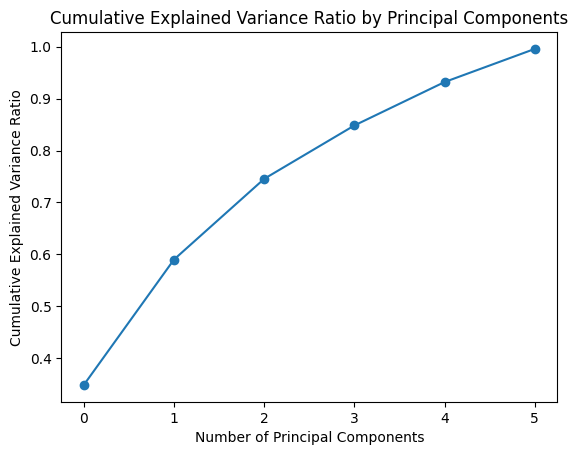

In [ ]:
# Calculate cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# Plotting the Cumulative Explained Variance Ratio
plt.plot(cumulative_variance_ratio, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio by Principal Components')
plt.show()


Despite PCA being an effective method for dimensionality reduction, given we don’t have a high
enough number of variables to affect the performance, we chose not to apply the PCA on our dataset
as it would increase the complexity of interpretation of the principal component, and the analysis itself.

## **5. Modelling Data**

### **5.1 Cluster Analysis: K-Means**

#### **5.1.1 Digital Dataset**

In [ ]:
import warnings
warnings.filterwarnings('ignore')
from sklearn.cluster import KMeans
from scipy.cluster import hierarchy #Dendrogram
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics import silhouette_score, silhouette_samples

In [ ]:
inertias =[]
for i in range(1,11):
    model=KMeans(n_clusters=i).fit(df_digital_scaled)
    inertias.append(model.inertia_)

We used the elbow method in order to choose the number of clusters to use further in the application of the K-means method

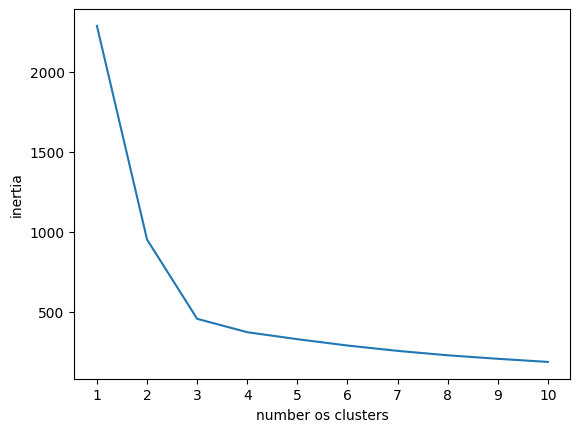

In [ ]:
plt.plot(range(1,11), inertias)
plt.xlabel('number os clusters')
plt.ylabel('inertia')
plt.xticks(range(1,11))
plt.show()

The 'elbow' point in the graph is usually considered as being a good choice for the number of clusters (2-3)

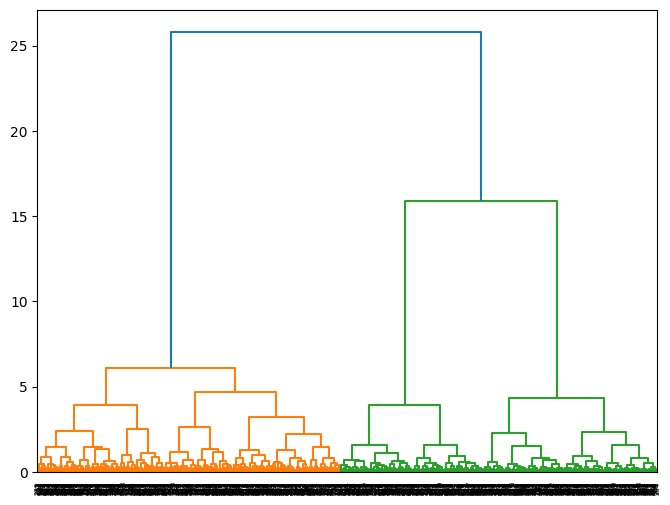

In [ ]:
df_digital_sample=df_digital_scaled.sample(n=1000, random_state=100)
clusters=hierarchy.linkage(df_digital_sample, method='ward')
plt.figure(figsize=(8,6))
dendrogram=hierarchy.dendrogram(clusters)

From performing Hierarchical Clustering analysis and creating the Dendogram, as expected, we get to the same conclusion as from the elbow method: the number of clusters we will test will be 2-3

##### **5.1.1.1 Applying K-means - K2**

In [ ]:
df_digital_k2=df_digital_scaled.copy()
model_k2=KMeans(n_clusters=2, random_state=100).fit(df_digital_k2)
df_digital_k2['label']=model_k2.labels_
df_digital_k2.groupby(['label']).mean().T

label,0,1
Email_Clicks,0.112493,0.469462
SM_Comments,0.657512,0.058811
App_Clicks,0.019585,0.275455
SM_Likes,0.586305,0.052766
SM_Shares,0.632974,0.038443
SM_Clicks,0.093385,0.482985


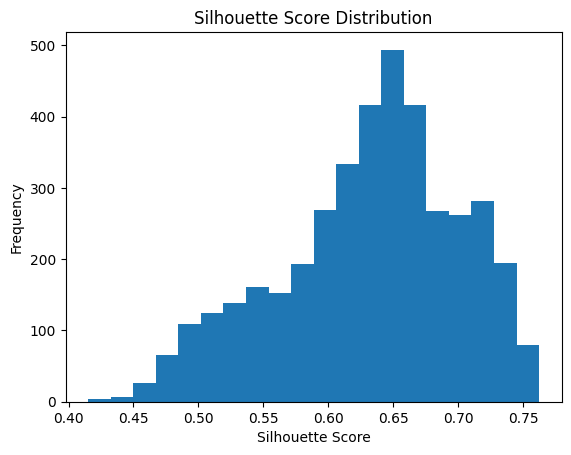

Average Silhouette Score: 0.6316380624014468


In [ ]:
silhouette_scores=silhouette_samples(df_digital_k2, model_k2.labels_)
average_silhouette_score = silhouette_score(df_digital_k2, model_k2.labels_)
plt.hist(silhouette_scores, bins=20)
plt.xlabel('Silhouette Score')
plt.ylabel('Frequency')
plt.title('Silhouette Score Distribution')
plt.show()
print(f'Average Silhouette Score: {average_silhouette_score}')

Using two clusters, we can conclude that:
- Cluster 0 is the one where customers engage more through SM_Comments, moderately high through SM_Likes and SM_Shares, have little engagement through EMail_Clicks and SM_Clicks and show almost no engagement through App_clicks
- Cluster 1 contains the customers who engage the most through Email_clicks and SM_Clicks and have a moderate egagement through App_cliks and show almost no engagement through SM_Comments, SM_Likes and SM_Shares

Now it is time to check with 3 clusters and see if we can still get distinct clusters.

In [ ]:
centroids = model_k2.cluster_centers_
centroids

array([[0.11249295, 0.65751229, 0.01958547, 0.58630496, 0.63297398,
        0.09338519],
       [0.46946217, 0.05881066, 0.27545525, 0.05276633, 0.03844318,
        0.4829847 ]])

In [ ]:
centroid_0_App_Clicks = centroids[0,2]
centroid_1_App_Clicks = centroids[1,2]
centroid_0_SM_Clicks = centroids[0,5]
centroid_1_SM_Clicks = centroids[1,5]

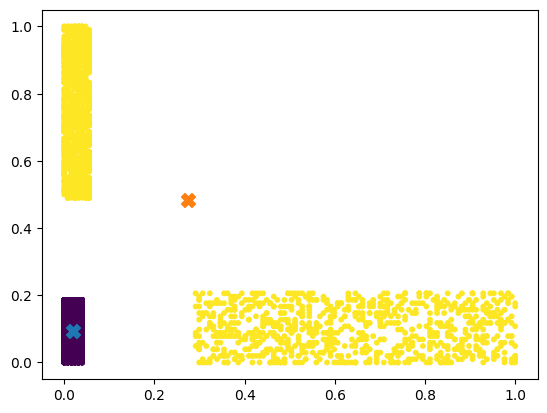

In [ ]:
plt.scatter(df_digital_k2.App_Clicks, df_digital_k2.SM_Clicks, c=df_digital_k2.label, s=10)
plt.scatter(centroid_0_App_Clicks, centroid_0_SM_Clicks, marker='X', s=100)
plt.scatter(centroid_1_App_Clicks, centroid_1_SM_Clicks, marker='X', s=100)
plt.show()


#### **5.1.1.2 K-Means - K3**

In [ ]:
df_digital_k3=df_digital_scaled.copy()
model_k3=KMeans(n_clusters=3, random_state=100).fit(df_digital_k3)
df_digital_k3['label']=model_k3.labels_
df_digital_k3.groupby(['label']).mean().T

label,0,1,2
Email_Clicks,0.112493,0.646997,0.210965
SM_Comments,0.657512,0.041633,0.083822
App_Clicks,0.019585,0.027591,0.636355
SM_Likes,0.586305,0.062948,0.037941
SM_Shares,0.632974,0.038870,0.037821
SM_Clicks,0.093385,0.745880,0.100200


By checking the above table, you can start to understand the distinct "behaviour" of the costumers according to the cluster they belong to. <br>

**Cluster0:** The customers in this cluster engage the most through SM_Comments, very highly through SM_Shares and SM_Likes, very little through Emai_Clicks and SM_Clicks and show almost no engagement through App_Clicks . This cluster is composed of 1903 customers.<br>

**Cluster1:** These are the customers who engage the least through App_clicks and engage the most through SM_Clicks and Email_Clicks. The cluster is composed of 1243 individuals.<br>

**Cluster2:** This cluster is composed of 854 customers and can be considered the cluster that groups individuals who engage the most through App_Clicks, moderately through Email_Clicks and almost don't engage through the rest.<br>

In [ ]:
dists = euclidean_distances(model_k3.cluster_centers_)
dists

array([[0.        , 1.31060122, 1.17225374],
       [1.31060122, 0.        , 0.98996253],
       [1.17225374, 0.98996253, 0.        ]])

What can we conclude?
- The nearest cluster to cluster 0 is Cluster 2 (1.17);
- The nearest cluster to cluster 1 is Cluster 2 (0.98);
- The nearest cluster to cluster 2 is cluster 1 (0.98);
- Cluster 0 and Cluster 1 are the farthest away (1.31).

Using the euclidean distance, we can also see that Cluster 0 and Cluster 1 are the farthest apart, while Cluster 2 is the nearest to both of them. This suggests that there is less overlap between the spending behaviors of Cluster 0 and Cluster 1, while Cluster 2 may share some similarities with both of them.

#### **5.1.1.3 Explore and analyze in detail the chosen number of clusters**

In [ ]:
cluster0 = df_digital_k3[df_digital_k3.label==0]
cluster1 = df_digital_k3[df_digital_k3.label==1]
cluster2 = df_digital_k3[df_digital_k3.label==2]

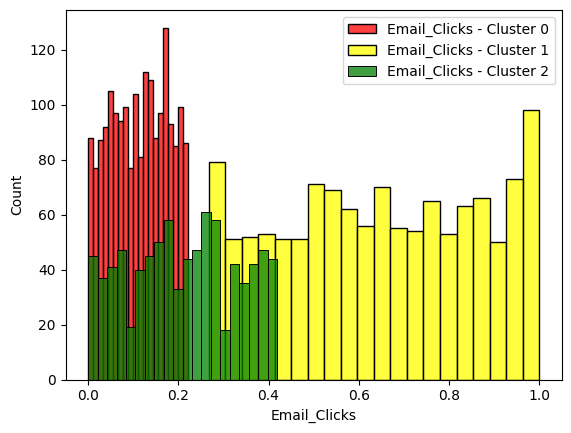

In [ ]:
#	Email_Clicks	SM_Comments	App_Clicks	SM_Likes	SM_Shares	SM_Clicks
sns.histplot(cluster0['Email_Clicks'],color='red',label='Email_Clicks - Cluster 0', bins = 20)
sns.histplot(cluster1['Email_Clicks'],color='yellow',label='Email_Clicks - Cluster 1', bins = 20)
sns.histplot(cluster2['Email_Clicks'],color='green',label='Email_Clicks - Cluster 2', bins = 20)
plt.legend()

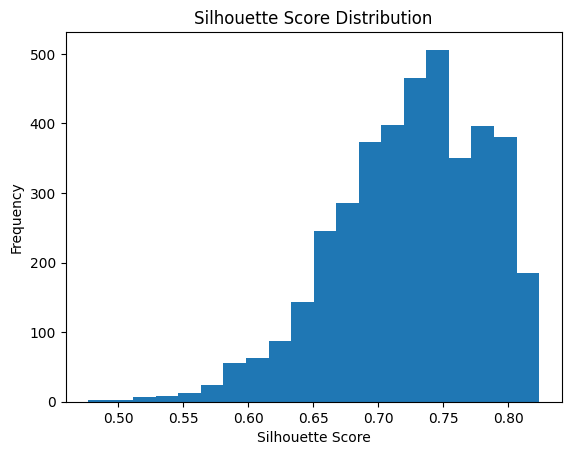

Average Silhouette Score: 0.7251190900978027


In [ ]:
silhouette_scores=silhouette_samples(df_digital_k3, model_k3.labels_)
average_silhouette_score = silhouette_score(df_digital_k3, model_k3.labels_)
plt.hist(silhouette_scores, bins=20)
plt.xlabel('Silhouette Score')
plt.ylabel('Frequency')
plt.title('Silhouette Score Distribution')
plt.show()
print(f'Average Silhouette Score: {average_silhouette_score}')

In [ ]:
df_digital_k3.columns

Index(['Email_Clicks', 'SM_Comments', 'App_Clicks', 'SM_Likes', 'SM_Shares',
       'SM_Clicks', 'label'],
      dtype='object')

In [ ]:
centroids = model_k3.cluster_centers_
centroids

array([[0.11249295, 0.65751229, 0.01958547, 0.58630496, 0.63297398,
        0.09338519],
       [0.64699659, 0.04163312, 0.02759075, 0.06294832, 0.03887031,
        0.74587951],
       [0.2109654 , 0.08382181, 0.63635524, 0.03794096, 0.03782126,
        0.10019999]])

In [ ]:
centroid_0_App_Clicks = centroids[0,2]
centroid_1_App_Clicks = centroids[1,2]
centroid_2_App_Clicks = centroids[2,2]
centroid_0_SM_Clicks = centroids[0,5]
centroid_1_SM_Clicks = centroids[1,5]
centroid_2_SM_Clicks = centroids[2,5]

In [ ]:
centroid_0_Email_Clicks = centroids[0,0]
centroid_1_Email_Clicks = centroids[1,0]
centroid_2_Email_Clicks = centroids[2,0]

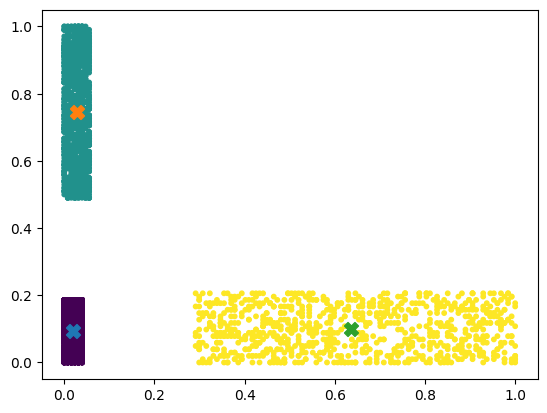

In [ ]:
plt.scatter(df_digital_k3.App_Clicks, df_digital_k3.SM_Clicks, c=df_digital_k3.label, s=10)
plt.scatter(centroid_0_App_Clicks, centroid_0_SM_Clicks, marker='X', s=100)
plt.scatter(centroid_1_App_Clicks, centroid_1_SM_Clicks, marker='X', s=100)
plt.scatter(centroid_2_App_Clicks, centroid_2_SM_Clicks, marker='X', s=100)
plt.show()

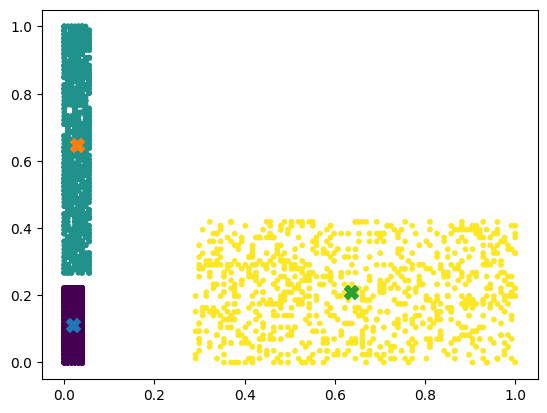

In [ ]:
plt.scatter(df_digital_k3.App_Clicks, df_digital_k3.Email_Clicks, c=df_digital_k3.label, s=10)
plt.scatter(centroid_0_App_Clicks, centroid_0_Email_Clicks, marker='X', s=100)
plt.scatter(centroid_1_App_Clicks, centroid_1_Email_Clicks, marker='X', s=100)
plt.scatter(centroid_2_App_Clicks, centroid_2_Email_Clicks, marker='X', s=100)
plt.show()

### **5.1.2 Products Dataset**

In [ ]:
df_products_scaled.columns

Index(['Fitness&Gym', 'Hiking&Running', 'sevenroot_Hiking&Running',
       'TeamGames', 'OutdoorActivities', 'TotalProducts', 'Recency'],
      dtype='object')

In [ ]:
df_products_scaled_kmeans = df_products_scaled.copy().drop(["Hiking&Running"], axis = 1)
inertias_prod =[]
for i in range(1,11):
    model=KMeans(n_clusters=i).fit(df_products_scaled_kmeans)
    inertias_prod.append(model.inertia_)

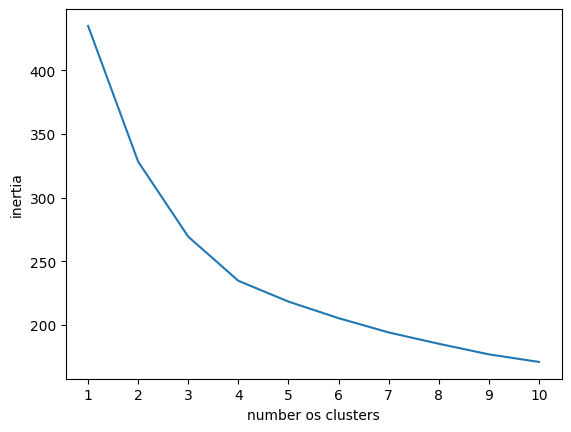

In [ ]:
plt.plot(range(1,11), inertias_prod)
plt.xlabel('number os clusters')
plt.ylabel('inertia')
plt.xticks(range(1,11))
plt.show()

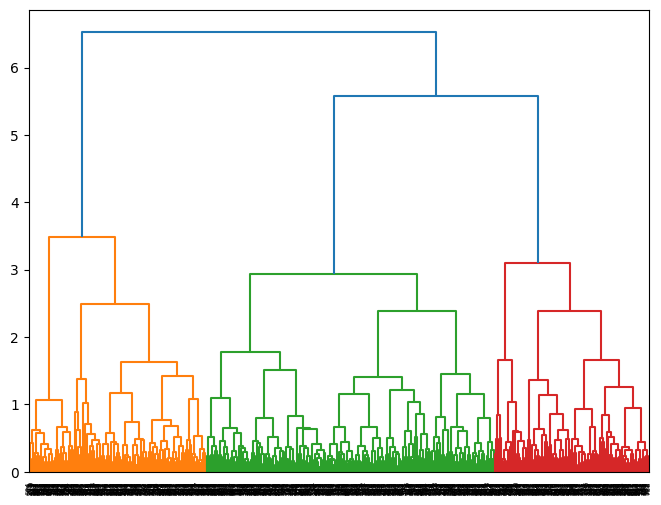

In [ ]:
df_products_sample=df_products_scaled_kmeans.sample(n=1000, random_state=100)
clusters=hierarchy.linkage(df_products_sample, method='ward')
plt.figure(figsize=(8,6))
dendrogram=hierarchy.dendrogram(clusters)

#### **5.1.2.1 K-means -K3**

In [ ]:

df_products_k3=df_products_scaled_kmeans.copy()
model_k3=KMeans(n_clusters=3, random_state=100).fit(df_products_k3)
df_products_k3['label']=model_k3.labels_
print(df_products_k3.groupby(['label']).mean().T)
df_products_k3.groupby(['label']).describe().T

label                            0         1         2
Fitness&Gym               0.389741  0.318927  0.248461
sevenroot_Hiking&Running  0.388989  0.311412  0.488520
TeamGames                 0.601565  0.292215  0.564907
OutdoorActivities         0.346410  0.381712  0.485277
TotalProducts             0.219220  0.203141  0.307702
Recency                   0.352949  0.231038  0.126788


label                                     0            1            2
Fitness&Gym              count  1158.000000  1724.000000  1111.000000
                         mean      0.389741     0.318927     0.248461
                         std       0.143468     0.099930     0.165277
                         min       0.090000     0.000000     0.000000
                         25%       0.280000     0.270000     0.100000
                         50%       0.360000     0.310000     0.250000
                         75%       0.490000     0.360000     0.370000
                         max       1.000000     0.740000     0.680000
sevenroot_Hiking&Running count  1158.000000  1724.000000  1111.000000
                         mean      0.388989     0.311412     0.488520
                         std       0.085567     0.066625     0.096342
                         min       0.205281     0.000000     0.263749
                         25%       0.347296     0.271152     0.437379
                         50%       0.373825     0.311812     0.489791
                         75%       0.407309     0.352802     0.525508
                         max       0.933861     0.706679     1.000000
TeamGames                count  1158.000000  1724.000000  1111.000000
                         mean      0.601565     0.292215     0.564907
                         std       0.111350     0.096001     0.100703
                         min       0.289062     0.000000     0.223958
                         25%       0.513021     0.223958     0.497396
                         50%       0.601562     0.294271     0.559896
                         75%       0.679688     0.367188     0.627604
                         max       1.000000     0.523438     0.953125
OutdoorActivities        count  1158.000000  1724.000000  1111.000000
                         mean      0.346410     0.381712     0.485277
                         std       0.099073     0.110735     0.116678
                         min       0.000000     0.071429     0.142857
                         25%       0.285714     0.285714     0.428571
                         50%       0.357143     0.357143     0.500000
                         75%       0.428571     0.428571     0.571429
                         max       0.714286     0.785714     1.000000
TotalProducts            count  1158.000000  1724.000000  1111.000000
                         mean      0.219220     0.203141     0.307702
                         std       0.085364     0.089763     0.108278
                         min       0.071429     0.000000     0.071429
                         25%       0.142857     0.142857     0.214286
                         50%       0.214286     0.214286     0.285714
                         75%       0.285714     0.285714     0.357143
                         max       0.571429     0.571429     1.000000
Recency                  count  1158.000000  1724.000000  1111.000000
                         mean      0.352949     0.231038     0.126788
                         std       0.130294     0.108046     0.081786
                         min       0.032520     0.008130     0.000000
                         25%       0.268293     0.154472     0.056911
                         50%       0.357724     0.227642     0.113821
                         75%       0.430894     0.300813     0.178862
                         max       1.000000     0.772358     0.544715

In [ ]:
cluster0 = df_products_k3[df_products_k3.label==0]
cluster1 = df_products_k3[df_products_k3.label==1]
cluster2 = df_products_k3[df_products_k3.label==2]

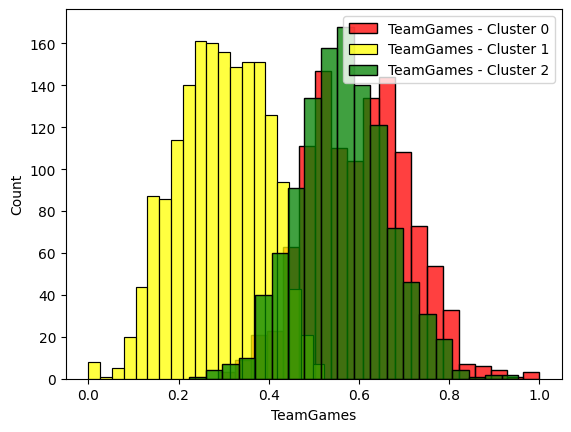

In [ ]:
#	Email_Clicks	SM_Comments	App_Clicks	SM_Likes	SM_Shares	SM_Clicks
sns.histplot(cluster0['TeamGames'],color='red',label='TeamGames - Cluster 0', bins = 20)
sns.histplot(cluster1['TeamGames'],color='yellow',label='TeamGames - Cluster 1', bins = 20)
sns.histplot(cluster2['TeamGames'],color='green',label='TeamGames - Cluster 2', bins = 20)
plt.legend()

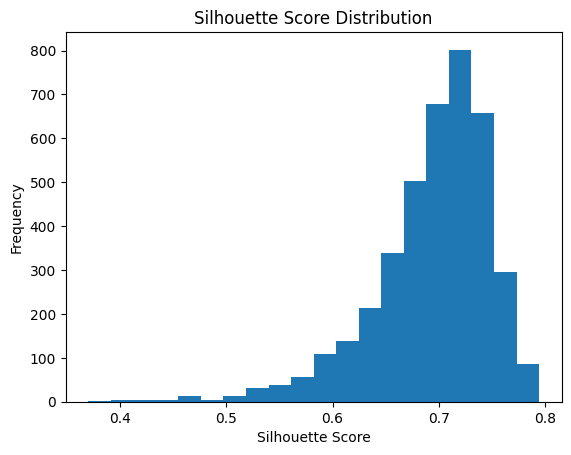

Average Silhouette Score: 0.6941574790652952


In [ ]:
silhouette_scores=silhouette_samples(df_products_k3, model_k3.labels_)
average_silhouette_score = silhouette_score(df_products_k3, model_k3.labels_)
plt.hist(silhouette_scores, bins=20)
plt.xlabel('Silhouette Score')
plt.ylabel('Frequency')
plt.title('Silhouette Score Distribution')
plt.show()
print(f'Average Silhouette Score: {average_silhouette_score}')

In [ ]:
df_products_k3.columns

Index(['Fitness&Gym', 'sevenroot_Hiking&Running', 'TeamGames',
       'OutdoorActivities', 'TotalProducts', 'Recency', 'label'],
      dtype='object')

In [ ]:
centroids_prod = model_k3.cluster_centers_
centroids_prod

array([[0.38976664, 0.38898158, 0.60163227, 0.34633905, 0.2192246 ,
        0.35308585],
       [0.31874203, 0.31139254, 0.29233998, 0.38169772, 0.203147  ,
        0.23104984],
       [0.24878488, 0.48862779, 0.56492134, 0.48534139, 0.3077022 ,
        0.12673706]])

In [ ]:
centroid_0_FitnessGym = centroids_prod[0,0]
centroid_1_FitnessGym = centroids_prod[1,0]
centroid_2_FitnessGym = centroids_prod[2,0]
centroid_0_TeamGames = centroids_prod[0,2]
centroid_1_TeamGames = centroids_prod[1,2]
centroid_2_TeamGames = centroids_prod[2,2]
centroid_0_Recency = centroids_prod[0,5]
centroid_1_Recency = centroids_prod[1,5]
centroid_2_Recency = centroids_prod[2,5]
centroid_0_TotalProducts = centroids_prod[0,4]
centroid_1_TotalProducts = centroids_prod[1,4]
centroid_2_TotalProducts = centroids_prod[2,4]

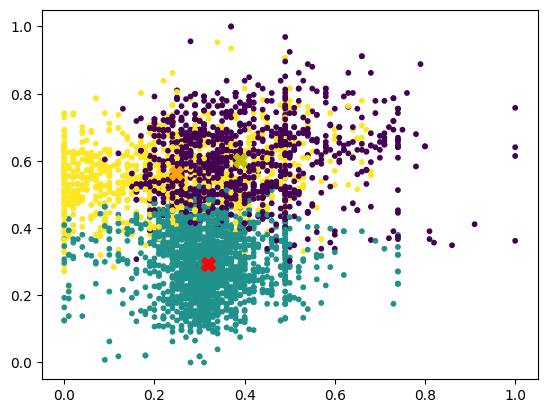

In [ ]:
plt.scatter(df_products_k3["Fitness&Gym"], df_products_k3.TeamGames, c=df_products_k3.label, s=10)
plt.scatter(centroid_0_FitnessGym, centroid_0_TeamGames, marker='X', s=100, color="y")
plt.scatter(centroid_1_FitnessGym, centroid_1_TeamGames, marker='X', s=100, color="r")
plt.scatter(centroid_2_FitnessGym, centroid_2_TeamGames, marker='X', s=100, color="orange")
plt.show()

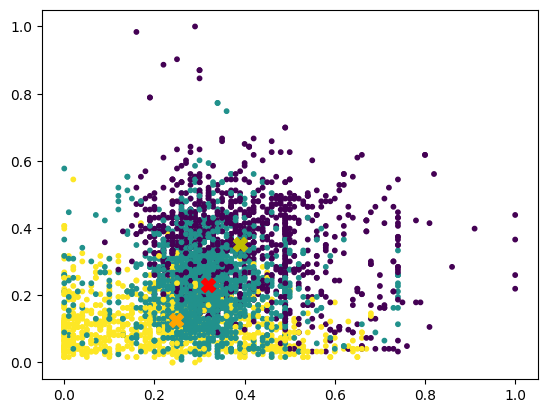

In [ ]:
plt.scatter(df_products_k3["Fitness&Gym"], df_products_k3.Recency, c=df_products_k3.label, s=10)
plt.scatter(centroid_0_FitnessGym, centroid_0_Recency, marker='X', s=100, color="y")
plt.scatter(centroid_1_FitnessGym, centroid_1_Recency, marker='X', s=100, color="r")
plt.scatter(centroid_2_FitnessGym, centroid_2_Recency, marker='X', s=100, color="orange")
plt.show()

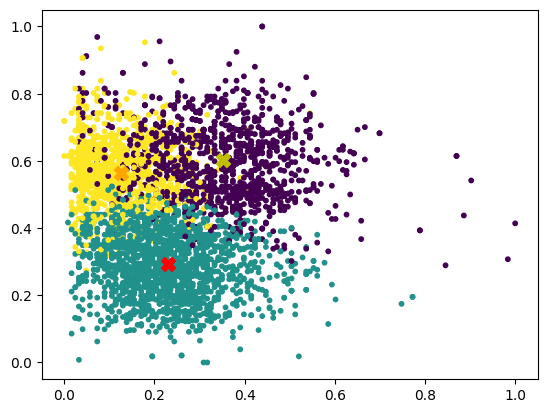

In [ ]:
plt.scatter(df_products_k3["Recency"], df_products_k3.TeamGames, c=df_products_k3.label, s=10)
plt.scatter(centroid_0_Recency, centroid_0_TeamGames, marker='X', s=100, color="y")
plt.scatter(centroid_1_Recency, centroid_1_TeamGames, marker='X', s=100, color="r")
plt.scatter(centroid_2_Recency, centroid_2_TeamGames, marker='X', s=100, color="orange")
plt.show()

#### **5.1.2.2 K-means -K4**

In [ ]:
df_products_k4=df_products_scaled_kmeans.copy()
model_k4=KMeans(n_clusters=4, random_state=100).fit(df_products_k4)
df_products_k4['label']=model_k4.labels_
print(df_products_k4.groupby(['label']).mean().T)
df_products_k4.groupby(['label']).describe().T

label                            0         1         2         3
Fitness&Gym               0.323179  0.355486  0.153690  0.482199
sevenroot_Hiking&Running  0.310191  0.375701  0.470036  0.502943
TeamGames                 0.288521  0.590411  0.536285  0.617850
OutdoorActivities         0.379378  0.352812  0.516670  0.390467
TotalProducts             0.203125  0.208648  0.274725  0.344988
Recency                   0.230281  0.376965  0.138031  0.128418


label                                     0            1           2  \
Fitness&Gym              count  1664.000000  1039.000000  767.000000   
                         mean      0.323179     0.355486    0.153690   
                         std       0.092939     0.119681    0.108682   
                         min       0.000000     0.090000    0.000000   
                         25%       0.270000     0.270000    0.050000   
                         50%       0.320000     0.330000    0.160000   
                         75%       0.370000     0.420000    0.240000   
                         max       0.740000     1.000000    0.440000   
sevenroot_Hiking&Running count  1664.000000  1039.000000  767.000000   
                         mean      0.310191     0.375701    0.470036   
                         std       0.065564     0.072471    0.084472   
                         min       0.000000     0.205281    0.240240   
                         25%       0.271152     0.335956    0.416215   
                         50%       0.311812     0.368711    0.486330   
                         75%       0.348672     0.398126    0.516165   
                         max       0.663289     0.933861    0.920337   
TeamGames                count  1664.000000  1039.000000  767.000000   
                         mean      0.288521     0.590411    0.536285   
                         std       0.094952     0.105828    0.096447   
                         min       0.000000     0.289062    0.164062   
                         25%       0.218750     0.507812    0.475260   
                         50%       0.289062     0.588542    0.541667   
                         75%       0.361979     0.669271    0.604167   
                         max       0.523438     0.955729    0.838542   
OutdoorActivities        count  1664.000000  1039.000000  767.000000   
                         mean      0.379378     0.352812    0.516670   
                         std       0.109815     0.099277    0.114177   
                         min       0.071429     0.000000    0.214286   
                         25%       0.285714     0.285714    0.428571   
                         50%       0.357143     0.357143    0.500000   
                         75%       0.428571     0.428571    0.571429   
                         max       0.785714     0.714286    1.000000   
TotalProducts            count  1664.000000  1039.000000  767.000000   
                         mean      0.203125     0.208648    0.274725   
                         std       0.090394     0.074643    0.084099   
                         min       0.000000     0.071429    0.071429   
                         25%       0.142857     0.142857    0.214286   
                         50%       0.214286     0.214286    0.285714   
                         75%       0.285714     0.214286    0.285714   
                         max       0.571429     0.571429    0.714286   
Recency                  count  1664.000000  1039.000000  767.000000   
                         mean      0.230281     0.376965    0.138031   
                         std       0.107062     0.114544    0.083275   
                         min       0.008130     0.089431    0.000000   
                         25%       0.154472     0.292683    0.073171   
                         50%       0.227642     0.373984    0.121951   
                         75%       0.292683     0.439024    0.195122   
                         max       0.772358     1.000000    0.544715   

label                                    3  
Fitness&Gym              count  523.000000  
                         mean     0.482199  
                         std      0.124437  
                         min      0.180000  
                         25%      0.400000  
                         50%      0.480000  
                         75%      0.540000  
                         max      1.000000  
sevenroot_Hiking&Running count  523.000000  
                     

In [ ]:
dists = euclidean_distances(model_k4.cluster_centers_)
dists

array([[0.        , 0.34456602, 0.38490203, 0.44891184],
       [0.34456602, 0.        , 0.37530715, 0.33879399],
       [0.38490203, 0.37530715, 0.        , 0.36960822],
       [0.44891184, 0.33879399, 0.36960822, 0.        ]])

#### **5.1.2.3 Explore and analyze in detail the chosen number of clusters**

In [ ]:
cluster0 = df_products_k4[df_products_k4.label==0]
cluster1 = df_products_k4[df_products_k4.label==1]
cluster2 = df_products_k4[df_products_k4.label==2]
cluster3 = df_products_k4[df_products_k4.label==3]

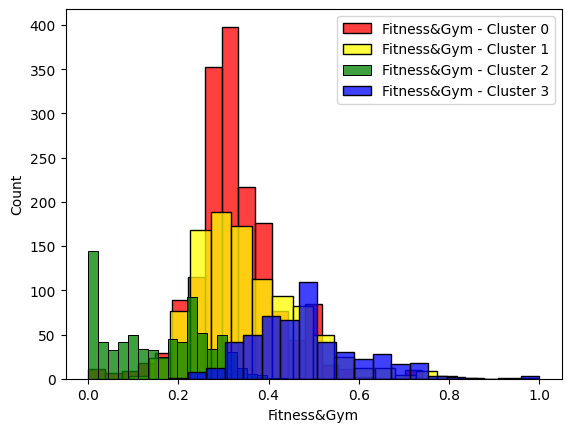

In [ ]:
sns.histplot(cluster0['Fitness&Gym'],color='red',label='Fitness&Gym - Cluster 0', bins = 20)
sns.histplot(cluster1['Fitness&Gym'],color='yellow',label='Fitness&Gym - Cluster 1', bins = 20)
sns.histplot(cluster2['Fitness&Gym'],color='green',label='Fitness&Gym - Cluster 2', bins = 20)
sns.histplot(cluster3['Fitness&Gym'],color='blue',label='Fitness&Gym - Cluster 3', bins = 20)
plt.legend()

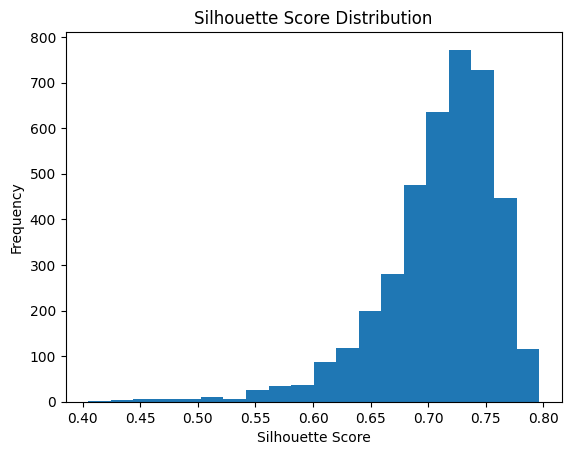

Average Silhouette Score: 0.7100303169241623


In [ ]:
silhouette_scores=silhouette_samples(df_products_k4, model_k4.labels_)
average_silhouette_score = silhouette_score(df_products_k4, model_k4.labels_)
plt.hist(silhouette_scores, bins=20)
plt.xlabel('Silhouette Score')
plt.ylabel('Frequency')
plt.title('Silhouette Score Distribution')
plt.show()
print(f'Average Silhouette Score: {average_silhouette_score}')

In [ ]:
df_products_k4.columns

Index(['Fitness&Gym', 'sevenroot_Hiking&Running', 'TeamGames',
       'OutdoorActivities', 'TotalProducts', 'Recency', 'label'],
      dtype='object')

In [ ]:
centroids_prod_k4 = model_k4.cluster_centers_
centroids_prod_k4

array([[0.32317909, 0.31019144, 0.28852101, 0.37937843, 0.203125  ,
        0.23028064],
       [0.35548604, 0.37570141, 0.59041145, 0.35281177, 0.20864843,
        0.37696503],
       [0.1536897 , 0.47003626, 0.53628517, 0.51666977, 0.27472527,
        0.13803118],
       [0.48219885, 0.50294296, 0.61784975, 0.39046709, 0.34498771,
        0.12841798]])

In [ ]:
centroid_0_FitnessGym = centroids_prod_k4[0,0]
centroid_1_FitnessGym = centroids_prod_k4[1,0]
centroid_2_FitnessGym = centroids_prod_k4[2,0]
centroid_3_FitnessGym = centroids_prod_k4[3,0]
centroid_0_TeamGames = centroids_prod_k4[0,2]
centroid_1_TeamGames = centroids_prod_k4[1,2]
centroid_2_TeamGames = centroids_prod_k4[2,2]
centroid_3_TeamGames = centroids_prod_k4[3,2]

In [ ]:
centroid_0_HikingRunning = centroids_prod_k4[0,1]
centroid_1_HikingRunning = centroids_prod_k4[1,1]
centroid_2_HikingRunning = centroids_prod_k4[2,1]
centroid_3_HikingRunning = centroids_prod_k4[3,1]
centroid_0_OutdoorActivities = centroids_prod_k4[0,3]
centroid_1_OutdoorActivities = centroids_prod_k4[1,3]
centroid_2_OutdoorActivities = centroids_prod_k4[2,3]
centroid_3_OutdoorActivities = centroids_prod_k4[3,3]
centroid_0_TotalProducts = centroids_prod_k4[0,4]
centroid_1_TotalProducts = centroids_prod_k4[1,4]
centroid_2_TotalProducts = centroids_prod_k4[2,4]
centroid_3_TotalProducts = centroids_prod_k4[3,4]
centroid_0_Recency = centroids_prod_k4[0,5]
centroid_1_Recency = centroids_prod_k4[1,5]
centroid_2_Recency = centroids_prod_k4[2,5]
centroid_3_Recency = centroids_prod_k4[3,5]


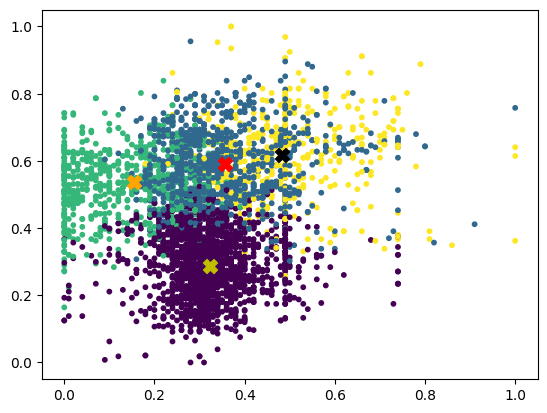

In [ ]:
plt.scatter(df_products_k4["Fitness&Gym"], df_products_k4.TeamGames, c=df_products_k4.label, s=10)
plt.scatter(centroid_0_FitnessGym, centroid_0_TeamGames, marker='X', s=100, color="y")
plt.scatter(centroid_1_FitnessGym, centroid_1_TeamGames, marker='X', s=100, color="r")
plt.scatter(centroid_2_FitnessGym, centroid_2_TeamGames, marker='X', s=100, color="orange")
plt.scatter(centroid_3_FitnessGym, centroid_3_TeamGames, marker='X', s=100, color="black")
plt.show()

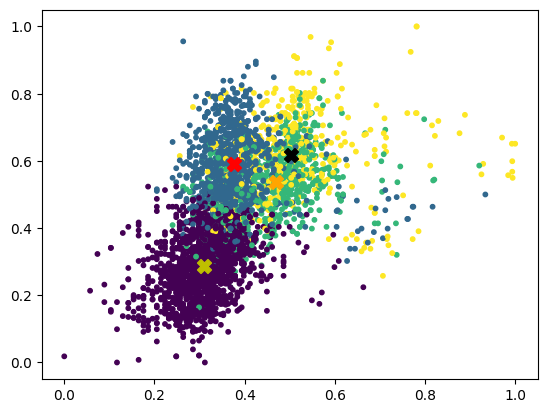

In [ ]:
plt.scatter(df_products_k4["sevenroot_Hiking&Running"], df_products_k4["TeamGames"], c=df_products_k4.label, s=10)
plt.scatter(centroid_0_HikingRunning, centroid_0_TeamGames, marker='X', s=100, color="y")
plt.scatter(centroid_1_HikingRunning, centroid_1_TeamGames, marker='X', s=100, color="r")
plt.scatter(centroid_2_HikingRunning, centroid_2_TeamGames, marker='X', s=100, color="orange")
plt.scatter(centroid_3_HikingRunning, centroid_3_TeamGames, marker='X', s=100, color="black")
plt.show()

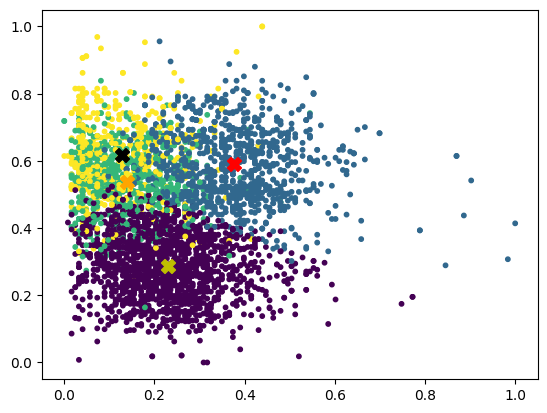

In [ ]:
plt.scatter(df_products_k4["Recency"], df_products_k4["TeamGames"], c=df_products_k4.label, s=10)
plt.scatter(centroid_0_Recency, centroid_0_TeamGames, marker='X', s=100, color="y")
plt.scatter(centroid_1_Recency, centroid_1_TeamGames, marker='X', s=100, color="r")
plt.scatter(centroid_2_Recency, centroid_2_TeamGames, marker='X', s=100, color="orange")
plt.scatter(centroid_3_Recency, centroid_3_TeamGames, marker='X', s=100, color="black")
plt.show()

###**5.1.3 Analyse further - checking variables not used during clustering**
####**5.1.3.1 Digital and Demographics**

In [ ]:
df["Dependents"]=df["dependents"].map({0:"N",1:"Y"})

In [ ]:
df["age_group"] = df["age_group"].astype('object')

In [ ]:
df_demo_initial = df[["Gender","education_level","age_group","Dependents"]].copy()
demo_view_dig = pd.concat([df_digital_k3, df_demo_initial], axis=1)

In [ ]:
demo_view_dig

,Email_Clicks,SM_Comments,App_Clicks,SM_Likes,SM_Shares,SM_Clicks,label,Gender,education_level,age_group,Dependents
Cust_ID,,,,,,,,,,,
4,0.837209,0.041667,0.055118,0.079545,0.038462,0.715686,1,M,Master,18-24 Years,Y
5,0.174419,0.833333,0.007874,0.397727,0.576923,0.156863,0,F,High School,25-34 Years,N
6,0.104651,0.291667,0.023622,0.829545,0.730769,0.098039,0,F,PhD,18-24 Years,Y
9,0.779070,0.000000,0.015748,0.000000,0.038462,0.990196,1,M,High School,18-24 Years,N
10,0.441860,0.000000,0.007874,0.102273,0.000000,0.549020,1,M,Less Than High School,18-24 Years,N
11,0.767442,0.041667,0.031496,0.079545,0.038462,0.911765,1,M,High School,18-24 Years,Y
12,0.139535,0.291667,0.023622,0.352273,0.538462,0.078431,0,F,PhD,18-24 Years,N
15,0.697674,0.083333,0.039370,0.011364,0.076923,0.558824,1,F,Less Than High School,65-80 Years,N
18,0.058140,0.500000,0.007874,0.431818,1.000000,0.117647,0,F,High School,25-34 Years,Y


In [ ]:
cluster0_demo_dig = demo_view_dig[demo_view_dig.label==0]
cluster1_demo_dig = demo_view_dig[demo_view_dig.label==1]
cluster2_demo_dig = demo_view_dig[demo_view_dig.label==2]

In [ ]:
cluster0_demo_dig.describe(include="O")

,Gender,education_level,age_group,Dependents
count,1898,1898,1898,1898
unique,2,5,6,2
top,F,High School,18-24 Years,N
freq,1638,607,933,1380


In [ ]:
cluster0_demo_dig.describe(exclude="O")

,Email_Clicks,SM_Comments,App_Clicks,SM_Likes,SM_Shares,SM_Clicks,label
count,1898.000000,1898.000000,1898.000000,1898.000000,1898.000000,1898.000000,1898.0
mean,0.112493,0.657512,0.019585,0.586305,0.632974,0.093385,0.0
std,0.065846,0.215838,0.013473,0.241809,0.219713,0.056655,0.0
min,0.000000,0.291667,0.000000,0.170455,0.269231,0.000000,0.0
25%,0.058140,0.458333,0.007874,0.375000,0.461538,0.049020,0.0
50%,0.116279,0.666667,0.023622,0.590909,0.615385,0.088235,0.0
75%,0.174419,0.833333,0.031496,0.795455,0.807692,0.147059,0.0
max,0.220930,1.000000,0.039370,1.000000,1.000000,0.186275,0.0


In [ ]:
cluster1_demo_dig.describe(include="O")

,Gender,education_level,age_group,Dependents
count,1242,1242,1242,1242
unique,2,5,6,2
top,M,High School,18-24 Years,N
freq,846,425,423,890


In [ ]:
cluster1_demo_dig.describe(exclude="O")

,Email_Clicks,SM_Comments,App_Clicks,SM_Likes,SM_Shares,SM_Clicks,label
count,1242.000000,1242.000000,1242.000000,1242.000000,1242.000000,1242.000000,1242.0
mean,0.646997,0.041633,0.027591,0.062948,0.038870,0.745880,1.0
std,0.217943,0.033973,0.017899,0.039891,0.031638,0.150191,0.0
min,0.267442,0.000000,0.000000,0.000000,0.000000,0.490196,1.0
25%,0.465116,0.000000,0.007874,0.022727,0.000000,0.617647,1.0
50%,0.639535,0.041667,0.031496,0.056818,0.038462,0.745098,1.0
75%,0.837209,0.083333,0.039370,0.102273,0.076923,0.882353,1.0
max,1.000000,0.083333,0.055118,0.125000,0.076923,1.000000,1.0


In [ ]:
cluster2_demo_dig.describe(include="O")

,Gender,education_level,age_group,Dependents
count,853,853,853,853
unique,2,5,6,2
top,M,High School,25-34 Years,N
freq,523,289,296,611


In [ ]:
cluster2_demo_dig.describe(exclude="O")

,Email_Clicks,SM_Comments,App_Clicks,SM_Likes,SM_Shares,SM_Clicks,label
count,853.000000,853.000000,853.000000,853.000000,853.000000,853.000000,853.0
mean,0.210965,0.083822,0.636355,0.037941,0.037821,0.100200,2.0
std,0.119828,0.059131,0.208004,0.026379,0.031520,0.062977,0.0
min,0.000000,0.000000,0.291339,0.000000,0.000000,0.000000,2.0
25%,0.116279,0.041667,0.456693,0.011364,0.000000,0.049020,2.0
50%,0.209302,0.083333,0.622047,0.034091,0.038462,0.098039,2.0
75%,0.302326,0.125000,0.826772,0.056818,0.076923,0.156863,2.0
max,0.418605,0.166667,1.000000,0.079545,0.076923,0.205882,2.0


In [ ]:
print("CLUSTER 0\n")
print(round(cluster0_demo_dig['Gender'].value_counts()/len(cluster0_demo_dig)*100,2))
print("\n",round(cluster0_demo_dig['age_group'].value_counts()/len(cluster0_demo_dig)*100,2))
print("\n",round(cluster0_demo_dig['education_level'].value_counts()/len(cluster0_demo_dig)*100,2))
print("\n",round(cluster0_demo_dig['Dependents'].value_counts()/len(cluster0_demo_dig)*100,2))

CLUSTER 0

Gender
F    86.3
M    13.7
Name: count, dtype: float64

 age_group
18-24 Years    49.16
25-34 Years    28.98
35-44 Years    10.27
45-54 Years     5.90
55-64 Years     4.74
65-80 Years     0.95
Name: count, dtype: float64

 education_level
High School              31.98
Bachelor                 26.61
Less Than High School    20.13
Master                   17.49
PhD                       3.79
Name: count, dtype: float64

 Dependents
N    72.71
Y    27.29
Name: count, dtype: float64


In [ ]:
print("CLUSTER 1\n")
print(round(cluster1_demo_dig['Gender'].value_counts()/len(cluster1_demo_dig)*100,2))
print("\n",round(cluster1_demo_dig['age_group'].value_counts()/len(cluster1_demo_dig)*100,2))
print("\n",round(cluster1_demo_dig['education_level'].value_counts()/len(cluster1_demo_dig)*100,2))
print("\n",round(cluster1_demo_dig['Dependents'].value_counts()/len(cluster1_demo_dig)*100,2))

CLUSTER 1

Gender
M    68.12
F    31.88
Name: count, dtype: float64

 age_group
18-24 Years    34.06
65-80 Years    20.61
55-64 Years    18.60
25-34 Years    18.44
35-44 Years     6.84
45-54 Years     1.45
Name: count, dtype: float64

 education_level
High School              34.22
Bachelor                 24.56
Less Than High School    20.77
Master                   15.46
PhD                       4.99
Name: count, dtype: float64

 Dependents
N    71.66
Y    28.34
Name: count, dtype: float64


In [ ]:
print("CLUSTER 2\n")
print(round(cluster2_demo_dig['Gender'].value_counts()/len(cluster2_demo_dig)*100,2))
print("\n",round(cluster2_demo_dig['age_group'].value_counts()/len(cluster2_demo_dig)*100,2))
print("\n",round(cluster2_demo_dig['education_level'].value_counts()/len(cluster2_demo_dig)*100,2))
print("\n",round(cluster2_demo_dig['Dependents'].value_counts()/len(cluster2_demo_dig)*100,2))

CLUSTER 2

Gender
M    61.31
F    38.69
Name: count, dtype: float64

 age_group
25-34 Years    34.70
18-24 Years    22.74
45-54 Years    12.66
35-44 Years    11.14
55-64 Years    10.79
65-80 Years     7.97
Name: count, dtype: float64

 education_level
High School              33.88
Bachelor                 24.85
Less Than High School    20.63
Master                   16.30
PhD                       4.34
Name: count, dtype: float64

 Dependents
N    71.63
Y    28.37
Name: count, dtype: float64


####**5.1.3.2 Products and Demographics**

In [ ]:
demo_view_prod = pd.concat([df_products_k3, df_demo_initial], axis=1)

In [ ]:
demo_view_prod

,Fitness&Gym,sevenroot_Hiking&Running,TeamGames,OutdoorActivities,TotalProducts,Recency,label,Gender,education_level,age_group,Dependents
Cust_ID,,,,,,,,,,,
4,0.00,0.486330,0.645833,0.642857,0.285714,0.081301,2,M,Master,18-24 Years,Y
5,0.00,0.482831,0.645833,0.642857,0.285714,0.097561,2,F,High School,25-34 Years,N
6,0.06,0.460953,0.559896,0.428571,0.214286,0.113821,2,F,PhD,18-24 Years,Y
9,0.36,0.468421,0.645833,0.500000,0.428571,0.130081,2,M,High School,18-24 Years,N
10,0.08,0.551987,0.531250,0.428571,0.214286,0.113821,2,M,Less Than High School,18-24 Years,N
11,0.36,0.468421,0.645833,0.500000,0.428571,0.130081,2,M,High School,18-24 Years,Y
12,0.00,0.528562,0.434896,0.642857,0.214286,0.121951,2,F,PhD,18-24 Years,N
15,0.19,0.711954,0.692708,0.357143,0.500000,0.406504,2,F,Less Than High School,65-80 Years,N
18,0.08,0.519310,0.622396,0.500000,0.214286,0.040650,2,F,High School,25-34 Years,Y


In [ ]:
cluster0_demo_prod = demo_view_prod[demo_view_prod.label==0]
cluster1_demo_prod = demo_view_prod[demo_view_prod.label==1]
cluster2_demo_prod = demo_view_prod[demo_view_prod.label==2]

In [ ]:
cluster0_demo_prod.describe(include="O")

,Gender,education_level,age_group,Dependents
count,1158,1158,1158,1158
unique,2,5,6,2
top,F,High School,18-24 Years,N
freq,709,346,444,744


In [ ]:
cluster0_demo_prod.describe(exclude="O")

,Fitness&Gym,sevenroot_Hiking&Running,TeamGames,OutdoorActivities,TotalProducts,Recency,label
count,1158.000000,1158.000000,1158.000000,1158.000000,1158.000000,1158.000000,1158.0
mean,0.389741,0.388989,0.601565,0.346410,0.219220,0.352949,0.0
std,0.143468,0.085567,0.111350,0.099073,0.085364,0.130294,0.0
min,0.090000,0.205281,0.289062,0.000000,0.071429,0.032520,0.0
25%,0.280000,0.347296,0.513021,0.285714,0.142857,0.268293,0.0
50%,0.360000,0.373825,0.601562,0.357143,0.214286,0.357724,0.0
75%,0.490000,0.407309,0.679688,0.428571,0.285714,0.430894,0.0
max,1.000000,0.933861,1.000000,0.714286,0.571429,1.000000,0.0


In [ ]:
cluster1_demo_prod.describe(include="O")

,Gender,education_level,age_group,Dependents
count,1724,1724,1724,1724
unique,2,5,6,2
top,F,High School,18-24 Years,N
freq,996,532,698,1278


In [ ]:
cluster1_demo_prod.describe(exclude="O")

,Fitness&Gym,sevenroot_Hiking&Running,TeamGames,OutdoorActivities,TotalProducts,Recency,label
count,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.0
mean,0.318927,0.311412,0.292215,0.381712,0.203141,0.231038,1.0
std,0.099930,0.066625,0.096001,0.110735,0.089763,0.108046,0.0
min,0.000000,0.000000,0.000000,0.071429,0.000000,0.008130,1.0
25%,0.270000,0.271152,0.223958,0.285714,0.142857,0.154472,1.0
50%,0.310000,0.311812,0.294271,0.357143,0.214286,0.227642,1.0
75%,0.360000,0.352802,0.367188,0.428571,0.285714,0.300813,1.0
max,0.740000,0.706679,0.523438,0.785714,0.571429,0.772358,1.0


In [ ]:
cluster2_demo_prod.describe(include="O")

,Gender,education_level,age_group,Dependents
count,1111,1111,1111,1111
unique,2,5,6,2
top,F,High School,18-24 Years,N
freq,659,443,408,859


In [ ]:
cluster2_demo_prod.describe(exclude="O")

,Fitness&Gym,sevenroot_Hiking&Running,TeamGames,OutdoorActivities,TotalProducts,Recency,label
count,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,1111.000000,1111.0
mean,0.248461,0.488520,0.564907,0.485277,0.307702,0.126788,2.0
std,0.165277,0.096342,0.100703,0.116678,0.108278,0.081786,0.0
min,0.000000,0.263749,0.223958,0.142857,0.071429,0.000000,2.0
25%,0.100000,0.437379,0.497396,0.428571,0.214286,0.056911,2.0
50%,0.250000,0.489791,0.559896,0.500000,0.285714,0.113821,2.0
75%,0.370000,0.525508,0.627604,0.571429,0.357143,0.178862,2.0
max,0.680000,1.000000,0.953125,1.000000,1.000000,0.544715,2.0


In [ ]:
print("CLUSTER 0\n")
print(round(cluster0_demo_prod['Gender'].value_counts()/len(cluster0_demo_prod)*100,2))
print("\n",round(cluster0_demo_prod['age_group'].value_counts()/len(cluster0_demo_prod)*100,2))
print("\n",round(cluster0_demo_prod['education_level'].value_counts()/len(cluster0_demo_prod)*100,2))
print("\n",round(cluster0_demo_prod['Dependents'].value_counts()/len(cluster0_demo_prod)*100,2))

CLUSTER 0

Gender
F    61.23
M    38.77
Name: count, dtype: float64

 age_group
18-24 Years    38.34
25-34 Years    26.77
55-64 Years    10.71
35-44 Years     9.76
65-80 Years     8.12
45-54 Years     6.30
Name: count, dtype: float64

 education_level
High School              29.88
Less Than High School    29.45
Bachelor                 26.34
Master                   12.35
PhD                       1.99
Name: count, dtype: float64

 Dependents
N    64.25
Y    35.75
Name: count, dtype: float64


In [ ]:
print("CLUSTER 1\n")
print(round(cluster1_demo_prod['Gender'].value_counts()/len(cluster1_demo_prod)*100,2))
print("\n",round(cluster1_demo_prod['age_group'].value_counts()/len(cluster1_demo_prod)*100,2))
print("\n",round(cluster1_demo_prod['education_level'].value_counts()/len(cluster1_demo_prod)*100,2))
print("\n",round(cluster1_demo_prod['Dependents'].value_counts()/len(cluster1_demo_prod)*100,2))

CLUSTER 1

Gender
F    57.77
M    42.23
Name: count, dtype: float64

 age_group
18-24 Years    40.49
25-34 Years    26.10
55-64 Years    10.15
35-44 Years     9.34
65-80 Years     8.70
45-54 Years     5.22
Name: count, dtype: float64

 education_level
High School              30.86
Bachelor                 29.52
Master                   18.62
Less Than High School    17.81
PhD                       3.19
Name: count, dtype: float64

 Dependents
N    74.13
Y    25.87
Name: count, dtype: float64


In [ ]:
print("CLUSTER 2\n")
print(round(cluster2_demo_prod['Gender'].value_counts()/len(cluster2_demo_prod)*100,2))
print("\n",round(cluster2_demo_prod['age_group'].value_counts()/len(cluster2_demo_prod)*100,2))
print("\n",round(cluster2_demo_prod['education_level'].value_counts()/len(cluster2_demo_prod)*100,2))
print("\n",round(cluster2_demo_prod['Dependents'].value_counts()/len(cluster2_demo_prod)*100,2))

CLUSTER 2

Gender
F    59.32
M    40.68
Name: count, dtype: float64

 age_group
18-24 Years    36.72
25-34 Years    28.35
55-64 Years    10.26
35-44 Years     9.09
65-80 Years     8.82
45-54 Years     6.75
Name: count, dtype: float64

 education_level
High School              39.87
Bachelor                 18.72
Master                   17.91
Less Than High School    15.12
PhD                       8.37
Name: count, dtype: float64

 Dependents
N    77.32
Y    22.68
Name: count, dtype: float64


### **5.2 Cluster Analysis: DBScan**

#### **5.2.1 DBSCAN Digital Dataset**

In [ ]:
df_digital_scaled.columns

Index(['Email_Clicks', 'SM_Comments', 'App_Clicks', 'SM_Likes', 'SM_Shares',
       'SM_Clicks'],
      dtype='object')

In [ ]:
df_digital_scaled_DBSCAN= df_digital_scaled[['Email_Clicks', 'SM_Comments', 'App_Clicks', 'SM_Likes', 'SM_Shares',
       'SM_Clicks']].copy()

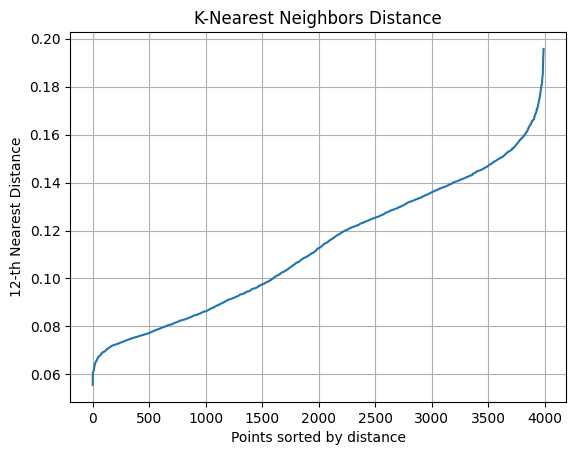

In [ ]:
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler


# Use NearestNeighbors to find the distance to the k-th nearest neighbor
min_samples = 12 # 2*D(dimensions of your dataset)
neighbors = NearestNeighbors(n_neighbors=min_samples)
neighbors_fit = neighbors.fit(df_digital_scaled_DBSCAN)
distances, indices = neighbors_fit.kneighbors(df_digital_scaled_DBSCAN)

# Sort distance values
sorted_distances = np.sort(distances[:, min_samples-1])
plt.plot(sorted_distances)
plt.ylabel(f'{min_samples}-th Nearest Distance')
plt.xlabel('Points sorted by distance')
plt.title('K-Nearest Neighbors Distance')
plt.grid(True)
plt.show()

# Based on the plot, choose an appropriate 'eps' where there is an "elbow"


In [ ]:
from sklearn.cluster import DBSCAN
df_digDBSCAN= df_digital_scaled_DBSCAN

# eps_value from elbow
eps_value = 0.2
min_samples = 12

# Apply DBSCAN using the estimated eps value
db = DBSCAN(eps=eps_value, min_samples=min_samples)
clusters = db.fit_predict(df_digDBSCAN)

# Clusters
df_digDBSCAN['label'] = db.labels_
print(df_digDBSCAN['label'].value_counts())

label
1    1898
0    1242
2     853
Name: count, dtype: int64


In [ ]:
df_digDBSCAN.groupby('label').mean().T

label,0,1,2
Email_Clicks,0.646997,0.112493,0.210965
SM_Comments,0.041633,0.657512,0.083822
App_Clicks,0.027591,0.019585,0.636355
SM_Likes,0.062948,0.586305,0.037941
SM_Shares,0.038870,0.632974,0.037821
SM_Clicks,0.745880,0.093385,0.100200


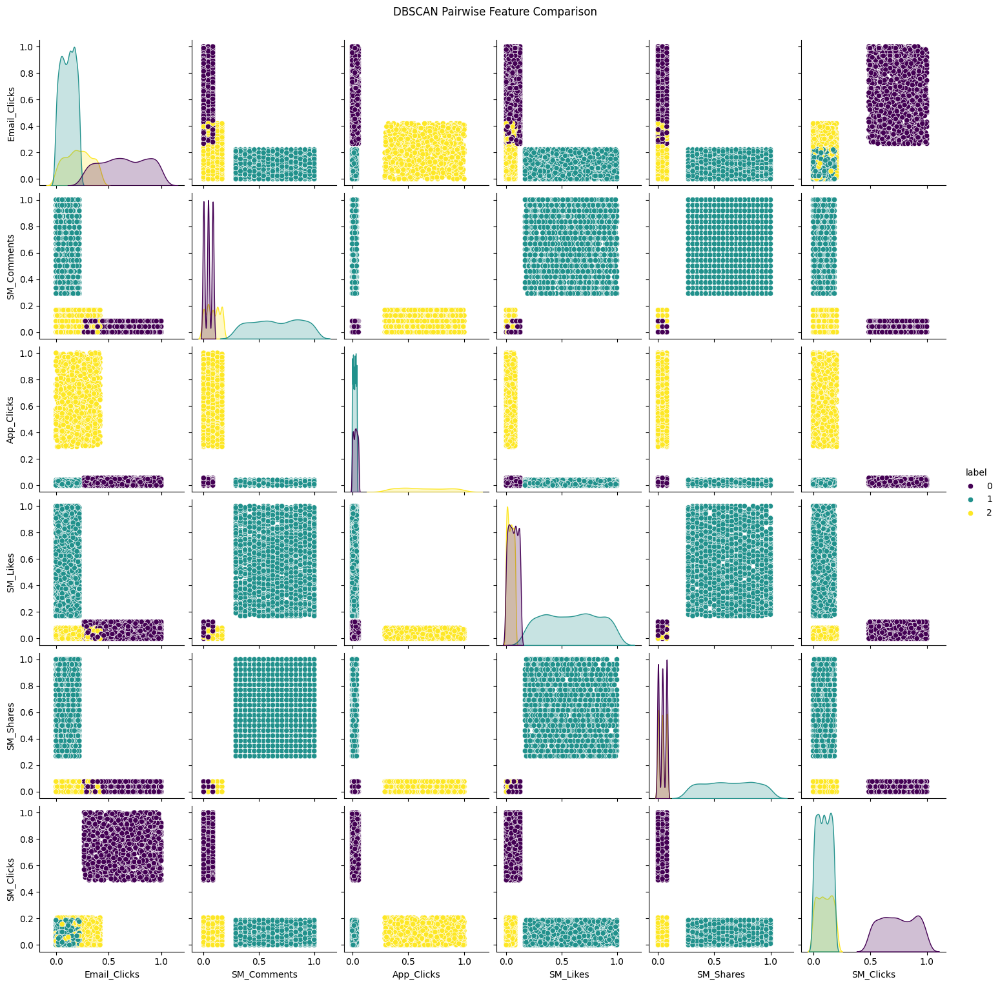

In [ ]:
# Assuming df_digDBSCAN is your DataFrame and it has been defined elsewhere
selected_features = ['Email_Clicks', 'SM_Comments', 'App_Clicks', 'SM_Likes', 'SM_Shares', 'SM_Clicks']

pairplot_fig = sns.pairplot(df_digDBSCAN[selected_features + ['label']], hue='label', palette='viridis')

# Set the title for the pairplot figure
pairplot_fig.fig.suptitle('DBSCAN Pairwise Feature Comparison', y=1.02)
plt.show()

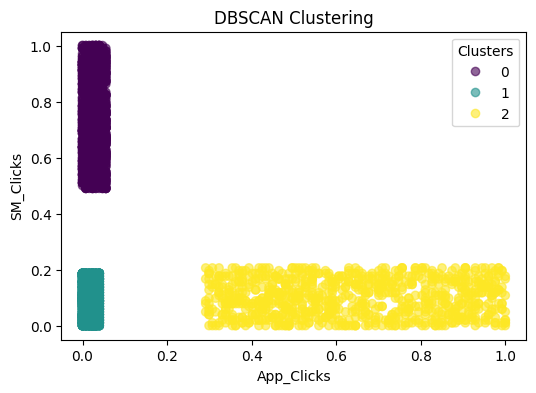

In [ ]:
variable_1 = 'App_Clicks'
variable_2 = 'SM_Clicks'

# Create the scatter plot
plt.figure(figsize=(6, 4))
scatter = plt.scatter(df_digital_scaled_DBSCAN[variable_1], df_digital_scaled_DBSCAN[variable_2],
                      c=df_digital_scaled_DBSCAN['label'], cmap='viridis', alpha=0.6)

# Adding Legend to Clusters
plt.legend(*scatter.legend_elements(), title="Clusters")

plt.xlabel(variable_1)
plt.ylabel(variable_2)
plt.title('DBSCAN Clustering')

plt.show()


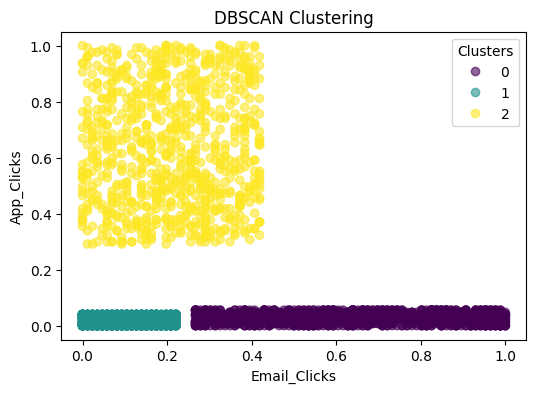

In [ ]:
variable_1 = 'Email_Clicks'
variable_2 = 'App_Clicks'

# Create the scatter plot
plt.figure(figsize=(6,4))
scatter = plt.scatter(df_digital_scaled_DBSCAN[variable_1], df_digital_scaled_DBSCAN[variable_2],
                      c=df_digital_scaled_DBSCAN['label'], cmap='viridis', alpha=0.6)

# Adding Legend to Clusters
plt.legend(*scatter.legend_elements(), title="Clusters")

plt.xlabel(variable_1)
plt.ylabel(variable_2)
plt.title('DBSCAN Clustering')

plt.show()

#### **5.2.2 DBSCAN Products Dataset**

In [ ]:
df_products_scaled.columns

Index(['Fitness&Gym', 'Hiking&Running', 'sevenroot_Hiking&Running',
       'TeamGames', 'OutdoorActivities', 'TotalProducts', 'Recency'],
      dtype='object')

In [ ]:
df_products_DBSCAN= df_products_scaled[['Fitness&Gym', 'sevenroot_Hiking&Running',
       'TeamGames', 'OutdoorActivities', 'Recency']].copy()

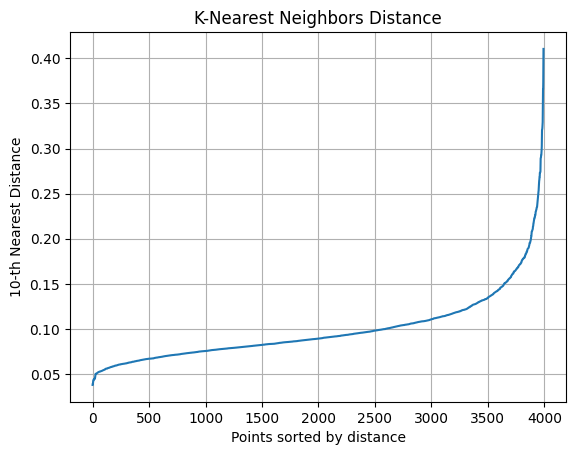

In [ ]:
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_samples, silhouette_score # for silhouette score

# Use NearestNeighbors to find the distance to the k-th nearest neighbor
min_samples = 10  # 2*D(dimensions of your dataset)
neighbors = NearestNeighbors(n_neighbors=min_samples)
neighbors_fit = neighbors.fit(df_products_DBSCAN)
distances, indices = neighbors_fit.kneighbors(df_products_DBSCAN)

# Sort distance values
sorted_distances = np.sort(distances[:, min_samples-1])
plt.plot(sorted_distances)
plt.ylabel(f'{min_samples}-th Nearest Distance')
plt.xlabel('Points sorted by distance')
plt.title('K-Nearest Neighbors Distance')
plt.grid(True)
plt.show()

# Based on the plot, choose an appropriate 'eps' where there is an "elbow"

In [ ]:
from sklearn.cluster import DBSCAN

df_DBSCAN= df_products_scaled.copy()
# Assume eps_value is obtained from KneeLocator or visual inspection
eps_value = 0.15
min_samples = 10

# Apply DBSCAN using the estimated eps value
db = DBSCAN(eps=eps_value, min_samples=min_samples)
clusters = db.fit_predict(df_DBSCAN)

# You can then analyze the clusters
df_DBSCAN['label'] = db.labels_
print(df_DBSCAN['label'].value_counts())

label
 0    3631
-1     362
Name: count, dtype: int64


In [ ]:
df_DBSCAN.groupby('label').mean().T

label,-1,0
Fitness&Gym,0.392293,0.312636
Hiking&Running,0.204734,0.103955
sevenroot_Hiking&Running,0.478951,0.373641
TeamGames,0.494360,0.454157
OutdoorActivities,0.393844,0.400932
TotalProducts,0.322218,0.228390
Recency,0.280959,0.233043


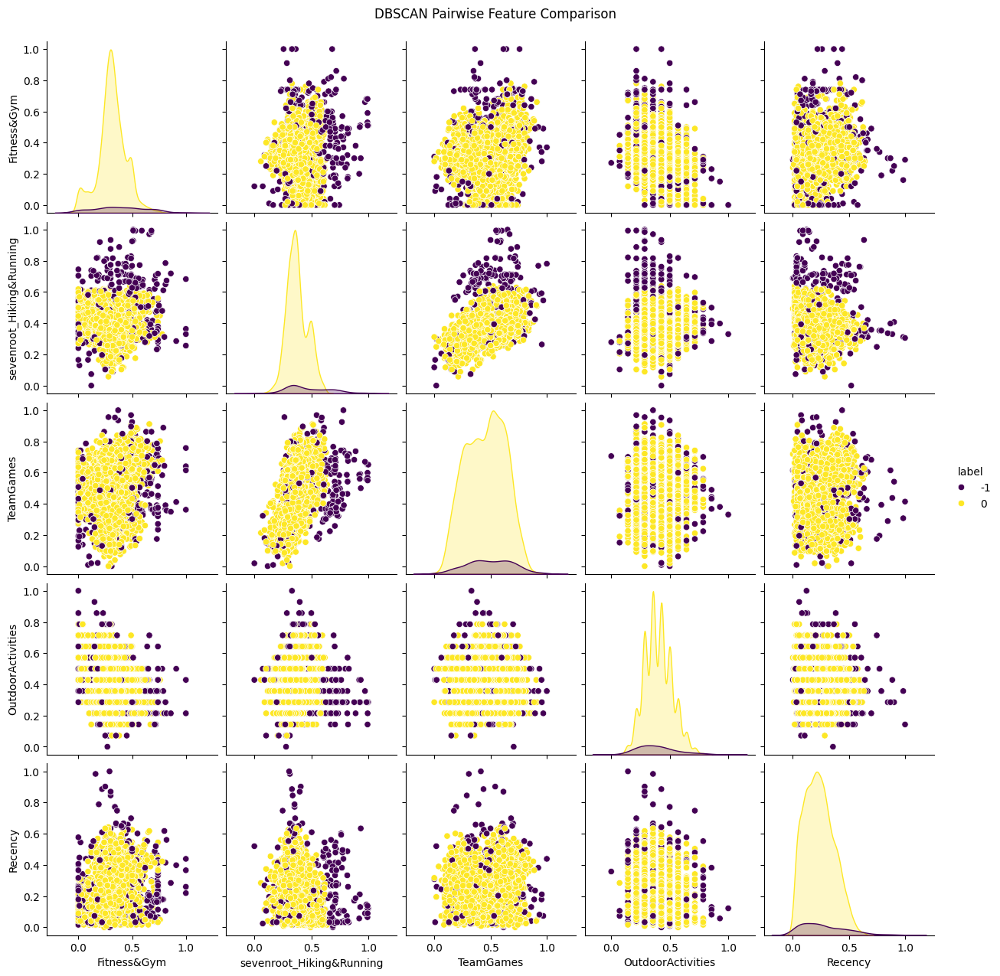

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Correctly select the features as a DataFrame
selected_features = df_DBSCAN[['Fitness&Gym', 'sevenroot_Hiking&Running', 'TeamGames', 'OutdoorActivities', 'Recency']]

# Assuming 'label' is the name of the column with DBSCAN labels
# Add the 'label' column to the DataFrame with selected features
selected_features_with_labels = selected_features.copy()
selected_features_with_labels['label'] = df_DBSCAN['label']

# Now create the pairplot with the correct DataFrame
pairplot_fig = sns.pairplot(selected_features_with_labels, hue='label', palette='viridis')

# Adjust the title and position
pairplot_fig.fig.suptitle('DBSCAN Pairwise Feature Comparison', y=1.02)
plt.show()


Unique labels (clusters) identified by DBSCAN: [ 0 -1]


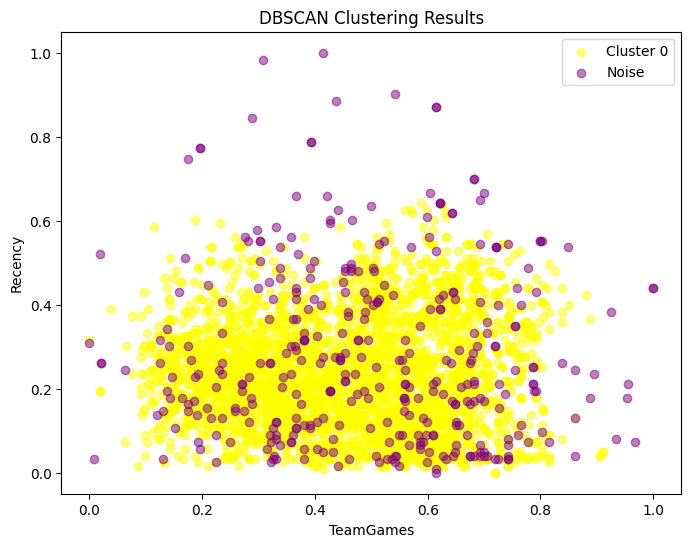

In [ ]:
# Check unique labels to ensure the cluster assignments
unique_labels = df_DBSCAN['label'].unique()
print("Unique labels (clusters) identified by DBSCAN:", unique_labels)

# Create the scatter plot
plt.figure(figsize=(8,6))

# Here we map the cluster label to a color.
color_map = {0: 'yellow', -1: 'purple'}  # Example: 0 for the main cluster, -1 for noise

# Scatter plot for cluster points
for label in unique_labels:
    # Separate the data by cluster
    cluster_data = df_DBSCAN[df_DBSCAN['label'] == label]
    plt.scatter(cluster_data['TeamGames'], cluster_data['Recency'],
                c=color_map[label], label=f'Cluster {label}' if label != -1 else 'Noise',
                alpha=0.5)

plt.legend()
plt.xlabel('TeamGames')
plt.ylabel('Recency')
plt.title('DBSCAN Clustering Results')

plt.show()


Unique labels (clusters) identified by DBSCAN: [ 0 -1]


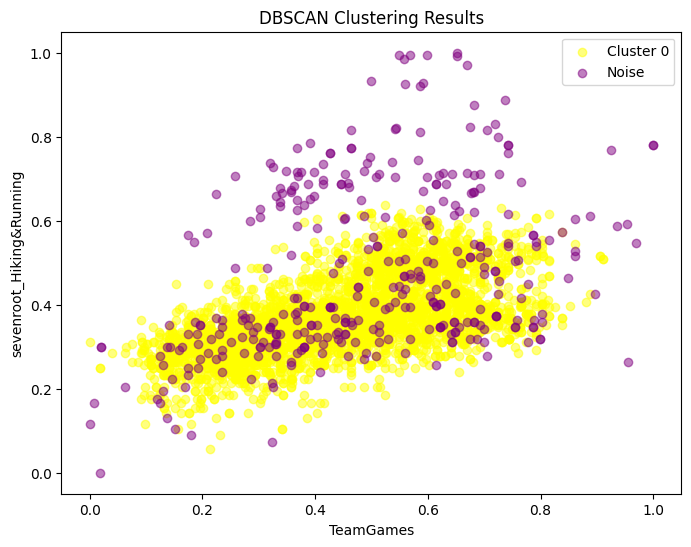

In [ ]:
# Check unique labels to ensure the cluster assignments
unique_labels = df_DBSCAN['label'].unique()
print("Unique labels (clusters) identified by DBSCAN:", unique_labels)

# Create the scatter plot
plt.figure(figsize=(8,6))

# Here we map the cluster label to a color.
color_map = {0: 'yellow', -1: 'purple'}  # Example: 0 for the main cluster, -1 for noise

# Scatter plot for cluster points
for label in unique_labels:
    # Separate the data by cluster
    cluster_data = df_DBSCAN[df_DBSCAN['label'] == label]
    plt.scatter(cluster_data['TeamGames'], cluster_data['sevenroot_Hiking&Running'],
                c=color_map[label], label=f'Cluster {label}' if label != -1 else 'Noise',
                alpha=0.5)

plt.legend()
plt.xlabel('TeamGames')
plt.ylabel('sevenroot_Hiking&Running')
plt.title('DBSCAN Clustering Results')

plt.show()